# Clustering Analysis

In this analysis we are looking at spatial variation of clusters relating to health and deprivation-related variables. Health is represented by number of deaths by preventable causes, found on on [Public Health England](https://fingertips.phe.org.uk/search/mortality). All data used in this analysis can be found on the relevant [Github Repo](https://github.com/signesw/Seeya_later).

## Import Packages

In [1]:
#Importing packages

import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl
import re
import os

In [2]:
#Importing machine learning packages and formatting

import sklearn
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.preprocessing import PowerTransformer, RobustScaler, StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans, DBSCAN, OPTICS
from esda.adbscan import ADBSCAN

import random
random.seed(42)    # For reproducibility
np.random.seed(42) # For reproducibility

# Make numeric display a bit neater
pd.set_option('display.float_format', lambda x: '{:,.2f}'.format(x))

In [3]:
from requests import get
from urllib.parse import urlparse

def cache_data(src:str, dest:str) -> str:
    """Downloads and caches a remote file locally.
    
    The function sits between the 'read' step of a pandas or geopandas
    data frame and downloading the file from a remote location. The idea
    is that it will save it locally so that you don't need to remember to
    do so yourself. Subsequent re-reads of the file will return instantly
    rather than downloading the entire file for a second or n-th itme.
    
    Parameters
    ----------
    src : str
        The remote *source* for the file, any valid URL should work.
    dest : str
        The *destination* location to save the downloaded file.
        
    Returns
    -------
    str
        A string representing the local location of the file.
    """
    
    url = urlparse(src) # We assume that this is some kind of valid URL 
    fn  = os.path.split(url.path)[-1] # Extract the filename
    dfn = os.path.join(dest,fn) # Destination filename
    
    # Check if dest+filename does *not* exist -- 
    # that would mean we have to download it!
    if not os.path.isfile(dfn):
        
        print(f"{dfn} not found, downloading!")

        # Convert the path back into a list (without)
        # the filename -- we need to check that directories
        # exist first.
        path = os.path.split(dest)
        
        # Create any missing directories in dest(ination) path
        # -- os.path.join is the reverse of split (as you saw above)
        # but it doesn't work with lists... so I had to google how
        # to use the 'splat' operator! os.makedirs creates missing
        # directories in a path automatically.
        if len(path) >= 1 and path[0] != '':
            os.makedirs(os.path.join(*path), exist_ok=True)
            
        # Download and write the file
        with open(dfn, "wb") as file:
            response = get(src)
            file.write(response.content)
            
        print('Done downloading...')

    else:
        print(f"Found {dfn} locally!")

    return dfn

## Loading MSOA shapefile

<AxesSubplot:>

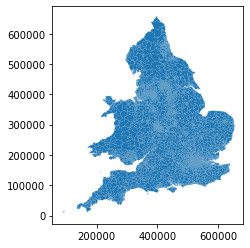

In [4]:
#loading the MSOAs for England and Wales

msoas = gpd.read_file('https://github.com/jreades/i2p/blob/master/data/src/Middle_Layer_Super_Output_Areas__December_2011__EW_BGC_V2-shp.zip?raw=true')
msoas.plot()

In [5]:
msoas.sample(3)

,OBJECTID,MSOA11CD,MSOA11NM,MSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,geometry
4512,4513,E02004616,Cotswold 002,Cotswold 002,419772,228556,-1.71,51.96,"106,158,692.62","76,239.60","POLYGON ((425815.906 237703.891, 425875.781 23..."
4660,4661,E02004768,Havant 007,Havant 007,468765,108410,-1.02,50.87,"1,489,727.28","6,299.57","POLYGON ((469134.341 109156.507, 469443.952 10..."
1038,1039,E02001074,Manchester 030,Manchester 030,383854,394300,-2.24,53.45,"1,933,712.23","7,950.69","POLYGON ((385403.077 394868.355, 385168.713 39..."


In [6]:
msoas.shape


(7201, 11)

In [7]:
msoas_england = msoas[msoas.MSOA11CD.str.startswith('E')]

In [8]:
msoas_england.head()

,OBJECTID,MSOA11CD,MSOA11NM,MSOA11NMW,BNG_E,BNG_N,LONG,LAT,Shape__Are,Shape__Len,geometry
0,1,E02000001,City of London 001,City of London 001,532384,181355,-0.09,51.52,"2,906,360.96","8,936.82","POLYGON ((532135.138 182198.131, 532158.250 18..."
1,2,E02000002,Barking and Dagenham 001,Barking and Dagenham 001,548267,189685,0.14,51.59,"2,166,163.21","8,150.41","POLYGON ((548881.563 190845.265, 548881.125 19..."
2,3,E02000003,Barking and Dagenham 002,Barking and Dagenham 002,548259,188520,0.14,51.58,"2,143,567.81","9,118.20","POLYGON ((549102.438 189324.625, 548954.517 18..."
3,4,E02000004,Barking and Dagenham 003,Barking and Dagenham 003,551004,186412,0.18,51.56,"2,491,466.74","8,206.55","POLYGON ((551550.056 187364.705, 551478.000 18..."
4,5,E02000005,Barking and Dagenham 004,Barking and Dagenham 004,548733,186824,0.14,51.56,"1,186,053.13","6,949.69","POLYGON ((549099.634 187656.076, 549161.375 18..."


In [9]:
msoas_england.shape

(6791, 11)

In [10]:
to_drop = ['MSOA11NMW','LONG','LAT','Shape__Are','Shape__Len']
msoas_england.drop(columns=to_drop, inplace = True)
print(msoas_england.shape)

(6791, 6)


/opt/conda/envs/sds2020/lib/python3.7/site-packages/pandas/core/frame.py:4174: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [11]:
msoas_england.head()

,OBJECTID,MSOA11CD,MSOA11NM,BNG_E,BNG_N,geometry
0,1,E02000001,City of London 001,532384,181355,"POLYGON ((532135.138 182198.131, 532158.250 18..."
1,2,E02000002,Barking and Dagenham 001,548267,189685,"POLYGON ((548881.563 190845.265, 548881.125 19..."
2,3,E02000003,Barking and Dagenham 002,548259,188520,"POLYGON ((549102.438 189324.625, 548954.517 18..."
3,4,E02000004,Barking and Dagenham 003,551004,186412,"POLYGON ((551550.056 187364.705, 551478.000 18..."
4,5,E02000005,Barking and Dagenham 004,548733,186824,"POLYGON ((549099.634 187656.076, 549161.375 18..."


In [12]:
msoas_england['borough'] = msoas_england.MSOA11NM.str.replace(r' \d+','',regex=True)

/opt/conda/envs/sds2020/lib/python3.7/site-packages/geopandas/geodataframe.py:853: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [13]:
#### Add MSOA Names using a Merge

#The House of Commons Library provides a [MSOA Names](https://visual.parliament.uk/msoanames) data set that contains locally-relevant names applied to MSOAs. 
#These seek to connect the Census geography (OA > LSOA > MSOA > LA) to a loosely-defined 'neighbourhood'.

In [14]:
msoa_nms = pd.read_csv('https://github.com/jreades/i2p/blob/master/data/src/MSOA-Names-1.8.csv.gz?raw=true', compression='gzip')

In [15]:
print(msoa_nms.columns.values)
msoa_nms.sample(3, random_state=42)

['msoa11cd' 'msoa11nm' 'msoa11nmw' 'msoa11hclnm' 'msoa11hclnmw' 'Laname']


,msoa11cd,msoa11nm,msoa11nmw,msoa11hclnm,msoa11hclnmw,Laname
4512,E02005951,Oxford 012,Oxford 012,Grandpont & New Hinksey,NaN,Oxford
4660,W02000113,Powys 017,Powys 017,Brecon,Aberhonddu,Powys
1038,W02000309,Caerphilly 020,Caerffili 020,Bedwas & Trethomas,Bedwas a Thretomas,Caerphilly


In [16]:
msoas = pd.merge(msoas_england, msoa_nms, how = 'inner' , left_on = 'MSOA11CD', right_on = 'msoa11cd')
print(msoas.shape)
print(type(msoas)) # You should check this -- result isn't always be a GeoDataFrame
msoas.sample(3, random_state=42)[['OBJECTID','MSOA11CD','MSOA11NM','msoa11hclnm']]

(6791, 13)
<class 'geopandas.geodataframe.GeoDataFrame'>


,OBJECTID,MSOA11CD,MSOA11NM,msoa11hclnm
3142,3143,E02003230,Swindon 019,Central South & Eastcott
3076,3077,E02003161,Torbay 008,Torquay Central
101,102,E02000104,Brent 012,Wembley North


In [17]:
msoas.columns

Index(['OBJECTID', 'MSOA11CD', 'MSOA11NM', 'BNG_E', 'BNG_N', 'geometry',
       'borough', 'msoa11cd', 'msoa11nm', 'msoa11nmw', 'msoa11hclnm',
       'msoa11hclnmw', 'Laname'],
      dtype='object')

In [18]:
# tidy up
to_drop = ['msoa11cd','msoa11nm','msoa11nmw','Laname','msoa11hclnmw']
msoas.drop(columns=to_drop, inplace=True)
print(msoas.shape)

(6791, 8)


In [19]:
msoas.columns

Index(['OBJECTID', 'MSOA11CD', 'MSOA11NM', 'BNG_E', 'BNG_N', 'geometry',
       'borough', 'msoa11hclnm'],
      dtype='object')

In [20]:
# check the coordinate reference system (crs)
msoas.crs

<Projected CRS: EPSG:27700>
Name: OSGB 1936 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: UK - Britain and UKCS 49°45'N to 61°N, 9°W to 2°E
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: OSGB 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [21]:
# change into the crs that we want
msoas = msoas.to_crs("EPSG:4326")
msoas.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [22]:
# SAVE

#msoas.to_file(os.path.join('data','England_MSOAs.gpkg'), driver='GPKG')

## Importing all data

### Health data


In [23]:
# Set download URL
url = 'https://raw.githubusercontent.com/signesw/Seeya_later/main/data/preventable_deaths_phe.csv'
deaths = pd.read_csv(url, low_memory=False)
print(f"Data frame is {deaths.shape[0]:,} x {deaths.shape[1]}")

Data frame is 6,791 x 5


In [24]:
deaths.head()

,Code,Label,Deaths from causes considered preventable\nlower confidence limit,Deaths from causes considered preventable,Deaths from causes considered preventable\nupper confidence limit
0,E02000001,City of London 001,49.90,68.50,91.60
1,E02000002,Barking and Dagenham 001,68.30,93.60,125.20
2,E02000003,Barking and Dagenham 002,79.80,101.80,128.00
3,E02000004,Barking and Dagenham 003,83.40,110.70,144.00
4,E02000005,Barking and Dagenham 004,79.10,103.90,134.00


In [25]:
deaths = deaths[['Code', 'Label', 'Deaths from causes considered preventable']]

In [26]:
deaths.head()

,Code,Label,Deaths from causes considered preventable
0,E02000001,City of London 001,68.50
1,E02000002,Barking and Dagenham 001,93.60
2,E02000003,Barking and Dagenham 002,101.80
3,E02000004,Barking and Dagenham 003,110.70
4,E02000005,Barking and Dagenham 004,103.90


In [27]:
deaths.shape

(6791, 3)

### Demographic data

In [28]:
## Reading in household poverty after housing costs
## IMD 2019 available at LSOA but was downloaded from https://research.mysociety.org/sites/imd2019/about/ at MSOA level
#the IMD decile was aggregated and averaged across the LSOAs that fall into the MSOAs

In [29]:
# Set download URL
url = 'https://raw.githubusercontent.com/signesw/Seeya_later/main/data/IMD2019-demographs-MSOA.csv'
socio_demo = pd.read_csv(url, low_memory=False)
socio_demo.head()

,MSOAC,MSOAHOCLN,LAD19C,LAD19N,REG,LSOACOUNT,POPMID15,IMD19 SCORE,MSOARANK,MSOADECILE,MSOAQUINTILE,Percentage of Households Below 60% of the Median Income; (after housing costs),Percentage of Households Below 60% of the Median Income; (after housing costs); 95% Confidence Interval Lower Limit,Percentage of Households Below 60% of the Median Income; (after housing costs); 95% Confidence Interval Upper Limit
0,E02000001,City of London,E09000001,City of London,London,6.00,"6,687.00",14.72,"4,198.00",7.00,4.00,15.50,8.10,27.40
1,E02000002,Marks Gate,E09000002,Barking and Dagenham,London,4.00,"7,379.00",34.77,"1,060.00",2.00,1.00,28.10,21.30,35.80
2,E02000003,Chadwell Heath East,E09000002,Barking and Dagenham,London,6.00,"10,720.00",25.15,"2,200.00",4.00,2.00,21.60,16.00,28.30
3,E02000004,Eastbrookend,E09000002,Barking and Dagenham,London,4.00,"6,536.00",23.56,"2,429.00",4.00,2.00,22.20,16.40,29.20
4,E02000005,Becontree Heath,E09000002,Barking and Dagenham,London,5.00,"9,243.00",30.21,"1,519.00",3.00,2.00,23.10,17.00,30.50


In [30]:
url = 'https://raw.githubusercontent.com/signesw/Seeya_later/main/data/community_data.csv'
pop_and_demo = pd.read_csv(url, low_memory=False)
pop_and_demo.rename(columns={'Code':'MSOAC'}, inplace=True)
pop_and_demo.head()

,MSOAC,Label,Black and Minority Ethnic Population\nlower confidence limit,Black and Minority Ethnic Population,Black and Minority Ethnic Population\nupper confidence limit,Long Term Unemployment\nlower confidence limit,Long Term Unemployment,Long Term Unemployment\nupper confidence limit,Index of Multiple Deprivation (IMD) Score 2015,Proportion of households in poverty\nlower confidence limit,...,Population aged 16 to 24 years\nupper confidence limit,Population aged 25 to 64 years\nlower confidence limit,Population aged 25 to 64 years,Population aged 25 to 64 years\nupper confidence limit,Population aged 65 years and over\nlower confidence limit,Population aged 65 years and over,Population aged 65 years and over\nupper confidence limit,Population aged 85 years and over\nlower confidence limit,Population aged 85 years and over,Population aged 85 years and over\nupper confidence limit
0,E02000001,City of London 001,20.40,21.40,22.30,1.80,3.00,4.90,13.60,8.10,...,9.70,55.50,56.60,57.70,18.50,19.40,20.30,2.30,2.60,3.00
1,E02000002,Barking and Dagenham 001,33.90,35.00,36.20,5.20,7.30,10.20,38.50,21.30,...,11.30,47.20,48.30,49.40,13.00,13.70,14.50,2.60,3.00,3.40
2,E02000003,Barking and Dagenham 002,44.40,45.40,46.40,2.50,3.70,5.40,25.70,16.00,...,10.80,53.10,54.10,55.00,11.60,12.20,12.90,1.60,1.90,2.20
3,E02000004,Barking and Dagenham 003,18.10,19.00,20.00,5.70,7.90,11.10,24.80,16.40,...,14.20,49.20,50.40,51.60,15.40,16.30,17.20,3.00,3.40,3.80
4,E02000005,Barking and Dagenham 004,32.70,33.70,34.70,3.00,4.40,6.30,32.50,17.00,...,11.80,51.20,52.20,53.20,9.00,9.60,10.20,1.20,1.40,1.60


In [31]:
url = 'https://raw.githubusercontent.com/signesw/Seeya_later/main/data/Ethnicities.csv'
ethnicities = pd.read_csv(url,low_memory=False)
ethnicities.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6791 entries, 0 to 6790
Data columns (total 9 columns):
 #   Column                            Non-Null Count  Dtype 
---  ------                            --------------  ----- 
 0   MSOA Code                         6791 non-null   object
 1   MSOA Name                         6791 non-null   object
 2   All                               6791 non-null   int64 
 3   White                             6791 non-null   int64 
 4   Asian/Asian British: Indian       6791 non-null   int64 
 5   Asian/Asian British: Pakistani    6791 non-null   int64 
 6   Asian/Asian British: Bangladeshi  6791 non-null   int64 
 7   Asian/Asian British: Chinese      6791 non-null   int64 
 8   Black                             6791 non-null   int64 
dtypes: int64(7), object(2)
memory usage: 477.6+ KB


In [32]:
#reading in more detailed ethnicities data

url = 'https://raw.githubusercontent.com/signesw/Seeya_later/main/data/Ethnicities.csv'
ethnicities = pd.read_csv(url,low_memory=False)
#calculating percentages of total population per MSOA of each ethnicity
ethnicities[['White', 'Asian/Asian British: Indian',
             'Asian/Asian British: Pakistani', 'Asian/Asian British: Bangladeshi',
             'Asian/Asian British: Chinese', 'Black']] = ethnicities[['White', 'Asian/Asian British: Indian',
             'Asian/Asian British: Pakistani', 'Asian/Asian British: Bangladeshi',
             'Asian/Asian British: Chinese', 'Black']].divide(ethnicities['All'], axis='index')
#create 'other' column
ethnicities['Other'] = ethnicities[['White', 'Asian/Asian British: Indian',
             'Asian/Asian British: Pakistani', 'Asian/Asian British: Bangladeshi',
             'Asian/Asian British: Chinese', 'Black']].sum(axis=1)

ethnicities['Other'] = 1 - ethnicities['Other']

#creating combined categories of ethnicities 
ethnicities['Chinese_Other'] = ethnicities[['Asian/Asian British: Chinese','Other']].sum(axis=1)
ethnicities['Subcont'] = ethnicities[['Asian/Asian British: Indian', 'Asian/Asian British: Pakistani', 'Asian/Asian British: Bangladeshi']].sum(axis=1)

ethnicities.drop(['Asian/Asian British: Indian',
             'Asian/Asian British: Pakistani', 'Asian/Asian British: Bangladeshi',
             'Asian/Asian British: Chinese', 'Other'], axis=1, inplace = True)

ethnicities.head()

,MSOA Code,MSOA Name,All,White,Black,Chinese_Other,Subcont
0,E02002559,Darlington 001,8842,0.97,0.00,0.02,0.01
1,E02002560,Darlington 002,5997,0.98,0.00,0.01,0.01
2,E02002561,Darlington 003,5741,0.98,0.00,0.02,0.01
3,E02002562,Darlington 004,6066,0.96,0.00,0.02,0.01
4,E02002563,Darlington 005,5463,0.98,0.00,0.02,0.00


In [33]:
#merge dataframes
pop_and_demo = pd.merge(socio_demo, pop_and_demo, on = 'MSOAC')
pop_and_demo = pd.merge(ethnicities, pop_and_demo, left_on = 'MSOA Code', right_on = 'MSOAC')
pop_and_demo.head()

,MSOA Code,MSOA Name,All,White,Black,Chinese_Other,Subcont,MSOAC,MSOAHOCLN,LAD19C,...,Population aged 16 to 24 years\nupper confidence limit,Population aged 25 to 64 years\nlower confidence limit,Population aged 25 to 64 years,Population aged 25 to 64 years\nupper confidence limit,Population aged 65 years and over\nlower confidence limit,Population aged 65 years and over,Population aged 65 years and over\nupper confidence limit,Population aged 85 years and over\nlower confidence limit,Population aged 85 years and over,Population aged 85 years and over\nupper confidence limit
0,E02002559,Darlington 001,8842,0.97,0.00,0.02,0.01,E02002559,"Faverdale, Heighington & Sadberge",E06000005,...,8.20,52.20,53.20,54.30,18.60,19.40,20.30,1.40,1.60,1.90
1,E02002560,Darlington 002,5997,0.98,0.00,0.01,0.01,E02002560,Harrowgate Hill,E06000005,...,9.60,51.20,52.40,53.60,17.30,18.30,19.30,1.20,1.40,1.80
2,E02002561,Darlington 003,5741,0.98,0.00,0.02,0.01,E02002561,Whinfield,E06000005,...,8.70,51.20,52.60,53.90,22.50,23.60,24.70,2.10,2.50,3.00
3,E02002562,Darlington 004,6066,0.96,0.00,0.02,0.01,E02002562,Rise Carr,E06000005,...,11.40,52.40,53.70,54.90,17.00,18.00,19.00,2.30,2.70,3.10
4,E02002563,Darlington 005,5463,0.98,0.00,0.02,0.00,E02002563,Haughton Le Skerne,E06000005,...,10.00,47.60,48.90,50.30,24.30,25.40,26.60,4.40,5.00,5.60


In [34]:
pop_and_demo.columns

Index(['MSOA Code', 'MSOA Name', 'All', 'White', 'Black', 'Chinese_Other',
       'Subcont', 'MSOAC', 'MSOAHOCLN', 'LAD19C', 'LAD19N', 'REG', 'LSOACOUNT',
       'POPMID15', 'IMD19 SCORE', 'MSOARANK', 'MSOADECILE', 'MSOAQUINTILE',
       'Percentage of Households Below 60% of the Median Income; (after housing costs)',
       'Percentage of Households Below 60% of the Median Income; (after housing costs); 95% Confidence Interval Lower Limit',
       'Percentage of Households Below 60% of the Median Income; (after housing costs); 95% Confidence Interval Upper Limit',
       'Label', 'Black and Minority Ethnic Population\nlower confidence limit',
       'Black and Minority Ethnic Population',
       'Black and Minority Ethnic Population\nupper confidence limit',
       'Long Term Unemployment\nlower confidence limit',
       'Long Term Unemployment',
       'Long Term Unemployment\nupper confidence limit',
       'Index of Multiple Deprivation (IMD) Score 2015',
       'Proportion of hous

In [35]:
to_keep = ['MSOAC', 'Label', 'White', 'Black', 'Chinese_Other',
           'Subcont','Long Term Unemployment','IMD19 SCORE', 
           'Percentage of Households Below 60% of the Median Income; (after housing costs)',
           'Proportion of households in poverty',
           'Population 0 to 15 years','Population aged 16 to 24 years', 
           'Population aged 25 to 64 years', 'Population aged 65 years and over', 
           'Population aged 85 years and over']

pop_and_demo = pop_and_demo[to_keep]
pop_and_demo.head()

,MSOAC,Label,White,Black,Chinese_Other,Subcont,Long Term Unemployment,IMD19 SCORE,Percentage of Households Below 60% of the Median Income; (after housing costs),Proportion of households in poverty,Population 0 to 15 years,Population aged 16 to 24 years,Population aged 25 to 64 years,Population aged 65 years and over,Population aged 85 years and over
0,E02002559,Darlington 001,0.97,0.00,0.02,0.01,0.90,13.22,13.00,13.00,19.70,7.60,53.20,19.40,1.60
1,E02002560,Darlington 002,0.98,0.00,0.01,0.01,4.20,15.88,13.00,13.00,20.50,8.90,52.40,18.30,1.40
2,E02002561,Darlington 003,0.98,0.00,0.02,0.01,4.20,17.18,16.00,16.00,15.90,8.00,52.60,23.60,2.50
3,E02002562,Darlington 004,0.96,0.00,0.02,0.01,15.40,41.12,32.70,32.70,17.70,10.60,53.70,18.00,2.70
4,E02002563,Darlington 005,0.98,0.00,0.02,0.00,6.10,28.71,20.30,20.30,16.50,9.20,48.90,25.40,5.00


In [36]:
#Rename MSOAC to Code and merge deaths data to demographic data

pop_and_demo.rename(columns={'MSOAC':'Code','Label_x':'Label'}, inplace=True)
variables = pd.merge(deaths, pop_and_demo, on = 'Code')
variables.drop(['Label_y','Percentage of Households Below 60% of the Median Income; (after housing costs)'], axis = 1, inplace = True)
variables.rename(columns={'Label_x':'Label'}, inplace = True)
variables.columns

Index(['Code', 'Label', 'Deaths from causes considered preventable', 'White',
       'Black', 'Chinese_Other', 'Subcont', 'Long Term Unemployment',
       'IMD19 SCORE', 'Proportion of households in poverty',
       'Population 0 to 15 years', 'Population aged 16 to 24 years',
       'Population aged 25 to 64 years', 'Population aged 65 years and over',
       'Population aged 85 years and over'],
      dtype='object')

## Initial Clustering and Mapping

In [37]:
#creating gdf

gdf = pd.merge(msoas, variables, left_on = 'MSOA11CD', right_on = 'Code', how = 'inner')

gdf = gdf.drop(columns=['MSOA11CD','White']).rename(columns={'Code': 'MSOA_code', 
                                                                'Deaths from causes considered preventable' : 'preventable_deaths',
                                                                'IMD19 SCORE':'imd19',
                                                                'Long Term Unemployment' : 'longterm_unemployed', 
                                                                'Proportion of households in poverty' : 'household_poverty',
                                                                'Population 0 to 15 years' : 'pop_0_15', 
                                                                'Population aged 16 to 24 years' : 'pop_16_24', 
                                                                'Population aged 25 to 64 years' : 'pop_25_64', 
                                                                'Population aged 65 years and over' : 'pop_above_65', 
                                                                'Population aged 85 years and over' : 'pop_above_85' , 
                                                                'White': 'white', 
                                                                'Black': 'black', 
                                                                'Chinese_Other': 'chinese_other', 
                                                                'Subcont': 'subcont'})

print(f"England MSOA preventable deaths and demographics data frame has shape {gdf.shape[0]:,} x {gdf.shape[1]}")
gdf.head()

England MSOA preventable deaths and demographics data frame has shape 6,791 x 21


,OBJECTID,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,MSOA_code,Label,preventable_deaths,...,chinese_other,subcont,longterm_unemployed,imd19,household_poverty,pop_0_15,pop_16_24,pop_25_64,pop_above_65,pop_above_85
0,1,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,E02000001,City of London 001,68.50,...,0.12,0.06,3.00,14.72,15.50,15.10,9.00,56.60,19.40,2.60
1,2,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,E02000002,Barking and Dagenham 001,93.60,...,0.10,0.09,7.30,34.77,28.10,27.40,10.60,48.30,13.70,3.00
2,3,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,E02000003,Barking and Dagenham 002,101.80,...,0.11,0.19,3.70,25.15,21.60,23.50,10.20,54.10,12.20,1.90
3,4,Barking and Dagenham 003,551004,186412,"POLYGON ((0.18508 51.56480, 0.18400 51.56391, ...",Barking and Dagenham,Eastbrookend,E02000004,Barking and Dagenham 003,110.70,...,0.06,0.02,7.90,23.56,22.20,20.00,13.30,50.40,16.30,3.40
4,5,Barking and Dagenham 004,548733,186824,"POLYGON ((0.14988 51.56807, 0.15076 51.56778, ...",Barking and Dagenham,Becontree Heath,E02000005,Barking and Dagenham 004,103.90,...,0.07,0.09,4.40,30.21,23.10,27.00,11.20,52.20,9.60,1.40


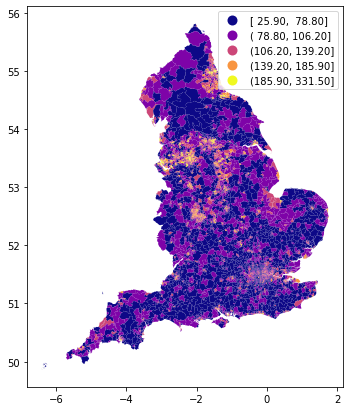

In [38]:
#Quick initial map
import mapclassify.classifiers as classifiers

gdf.plot(column='preventable_deaths', cmap='plasma', 
         scheme='FisherJenks', edgecolor='None', legend=True, figsize=(9,7));

In [39]:
gdf.columns

Index(['OBJECTID', 'MSOA11NM', 'BNG_E', 'BNG_N', 'geometry', 'borough',
       'msoa11hclnm', 'MSOA_code', 'Label', 'preventable_deaths', 'black',
       'chinese_other', 'subcont', 'longterm_unemployed', 'imd19',
       'household_poverty', 'pop_0_15', 'pop_16_24', 'pop_25_64',
       'pop_above_65', 'pop_above_85'],
      dtype='object')

In [40]:
gdf_vars = gdf[['preventable_deaths',
       'black', 'chinese_other', 'subcont', 'longterm_unemployed',
       'imd19', 'household_poverty', 'pop_0_15', 'pop_16_24',
       'pop_25_64', 'pop_above_65']] 

Text(0.5, 1.0, 'Correlation Matrix')

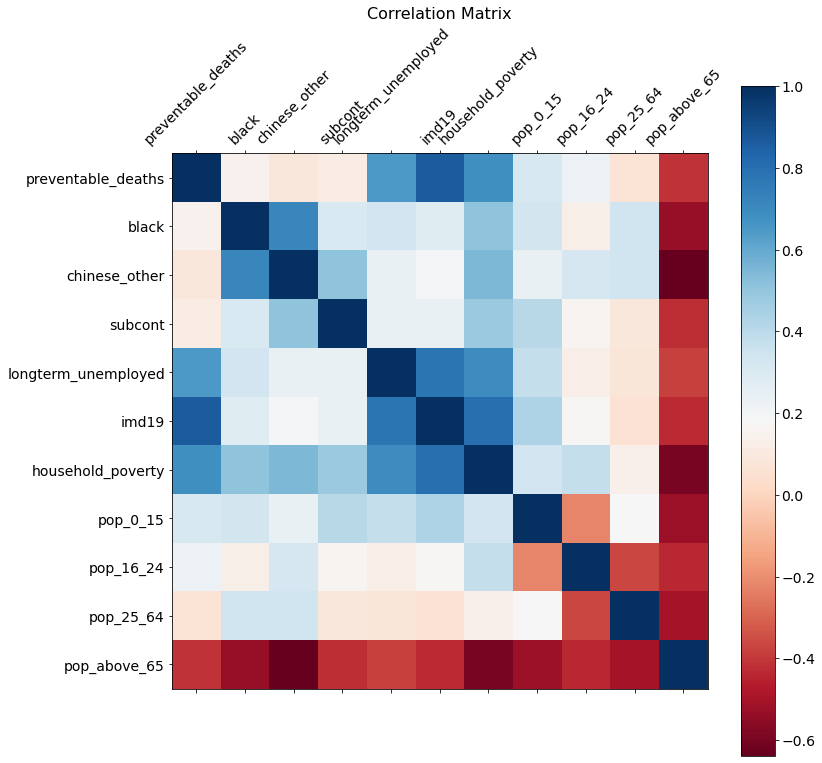

In [41]:
#plotting correlation matrix and checking for multicollinearity
plt.rcParams["axes.grid"] = False
f = plt.figure(figsize=(12, 12))
plt.matshow(gdf_vars.corr(), fignum=f.number, cmap= 'RdBu')
#cmap = cm.jet
#cmaps['Perceptually Uniform Sequential'] = [ 'viridis', 'plasma', 'inferno', 'magma', 'cividis']

plt.xticks(range(gdf_vars.shape[1]), gdf_vars.columns, fontsize=14, rotation=45)
plt.yticks(range(gdf_vars.shape[1]), gdf_vars.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
#plt.savefig('correlation_matrix.png', bbox_inches='tight')
#plt.matshow(corr, cmap=cm.jet)

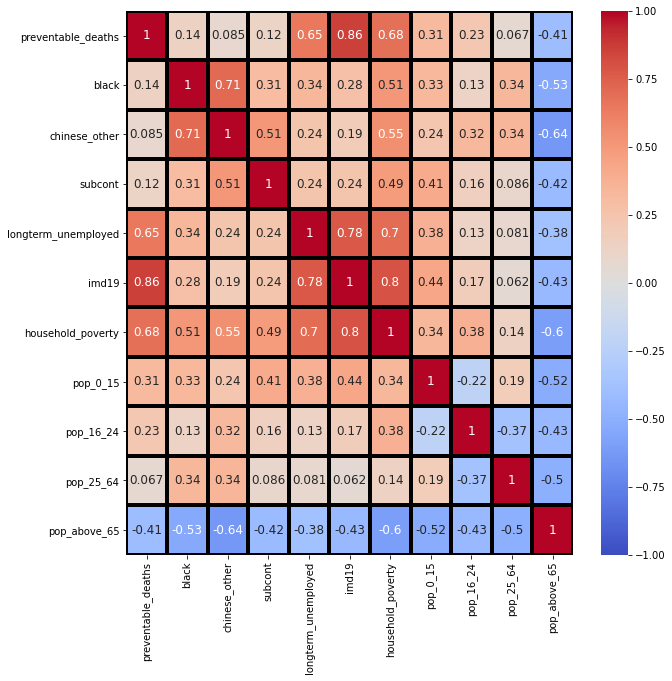

In [42]:
# trying this again with seaborn
# will make look nicer later
# code from this link:
#https://heartbeat.fritz.ai/seaborn-heatmaps-13-ways-to-customize-correlation-matrix-visualizations-f1c49c816f07

f, ax = plt.subplots(figsize=(10, 10))
ax = sns.heatmap(gdf_vars.corr(), annot = True, annot_kws={'size': 12}, vmin=-1, vmax=1, center= 0, cmap= 'coolwarm', linewidths=3, linecolor='black')
plt.savefig('plots/correlation_matrix.png', bbox_inches='tight')

#### 28/04/21
Dropping longterm unemployment and household poverty to see what the clusters look like
Reasonsing: highly correlated with both IMD2019;
also, theoretically, the IMD takes factors such as poverty and poor health into account (although maybe not via the same explicit variables). So this might explain the high correlation

In [43]:
gdf_vars = gdf_vars[['preventable_deaths',
       'black', 'chinese_other', 'subcont', 'imd19', 'pop_0_15', 'pop_16_24',
       'pop_25_64', 'pop_above_65']]

In [44]:
gdf_vars['MSOA11CD'] = gdf[['MSOA_code']]
gdf_vars = gdf_vars.fillna(0).set_index('MSOA11CD')
gdf_vars.head()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,68.50,0.03,0.12,0.06,14.72,15.10,9.00,56.60,19.40
E02000002,93.60,0.17,0.10,0.09,34.77,27.40,10.60,48.30,13.70
E02000003,101.80,0.16,0.11,0.19,25.15,23.50,10.20,54.10,12.20
E02000004,110.70,0.10,0.06,0.02,23.56,20.00,13.30,50.40,16.30
E02000005,103.90,0.17,0.07,0.09,30.21,27.00,11.20,52.20,9.60


### Standardising the Data

In [45]:
# make a copy of the df for each transformation

In [46]:
sts = StandardScaler()
rbs = RobustScaler(quantile_range=[25,25])
mms = MinMaxScaler(feature_range=(-1,1))
rbs2 = RobustScaler(quantile_range=[10,90])

In [47]:
gdf_vars1 = gdf_vars.copy()
for c in gdf_vars1.columns.values:
    gdf_vars1[c] = sts.fit_transform(gdf_vars1[c].values.reshape(-1,1))
gdf_vars1.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-0.91,-0.10,1.31,0.11,-0.52,-1.00,-0.28,1.00,0.12
E02000002,-0.26,2.13,0.77,0.35,1.00,2.15,0.01,-0.75,-0.72
E02000003,-0.04,2.03,1.00,1.30,0.27,1.15,-0.06,0.47,-0.93


In [48]:
gdf_vars2 = gdf_vars.copy()

for c in gdf_vars2.columns.values:
    gdf_vars2[c] = rbs.fit_transform(gdf_vars2[c].values.reshape(-1,1))
gdf_vars2.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-26.10,0.02,0.10,0.05,-3.48,-3.60,-0.50,5.00,0.80
E02000002,-1.00,0.16,0.07,0.07,16.57,8.70,1.10,-3.30,-4.90
E02000003,7.20,0.15,0.08,0.17,6.95,4.80,0.70,2.50,-6.40


In [49]:
gdf_vars3 = gdf_vars.copy()

for c in gdf_vars3.columns.values:
    gdf_vars3[c] = mms.fit_transform(gdf_vars3[c].values.reshape(-1,1))
gdf_vars3.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-0.72,-0.90,-0.34,-0.84,-0.70,-0.26,-0.88,0.40,-0.27
E02000002,-0.56,-0.39,-0.50,-0.78,-0.23,0.41,-0.84,0.14,-0.49
E02000003,-0.50,-0.41,-0.43,-0.54,-0.46,0.20,-0.85,0.32,-0.55


In [50]:
gdf_vars4 = gdf_vars.copy()

for c in gdf_vars4.columns.values:
    gdf_vars4[c] = rbs2.fit_transform(gdf_vars4[c].values.reshape(-1,1))
gdf_vars4.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-0.28,0.20,0.76,0.39,-0.11,-0.39,-0.10,0.51,0.05
E02000002,-0.01,1.71,0.52,0.59,0.50,0.94,0.22,-0.33,-0.28
E02000003,0.08,1.65,0.62,1.35,0.21,0.52,0.14,0.25,-0.36


### Making the data more gaussian - Transformation

In [51]:
# https://machinelearningmastery.com/power-transforms-with-scikit-learn/

pts1 = PowerTransformer(method='yeo-johnson')
#pts2 = PowerTransformer(method='box-cox') #turns out we cannot use this method as the data must be 'strictly positive', and we have many 0 values
# np.log will also be used

In [52]:
gdf_vars11 = gdf_vars1.copy()
for c in gdf_vars11.columns.values:
    gdf_vars11[c] = pts1.fit_transform(gdf_vars11[c].values.reshape(-1,1))
gdf_vars11.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-1.05,0.69,1.45,1.14,-0.41,-1.01,-0.22,1.00,0.17
E02000002,-0.06,1.89,1.21,1.43,1.10,2.03,0.56,-0.75,-0.70
E02000003,0.20,1.89,1.32,1.84,0.55,1.14,0.40,0.47,-0.94


In [53]:
gdf_vars12 = gdf_vars1.copy()
for c in gdf_vars12.columns.values:
    gdf_vars12[c] = np.log(gdf_vars12[c].values.reshape(-1,1))
gdf_vars12.head(3)

/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,nan,nan,0.27,-2.18,nan,nan,nan,-0.00,-2.14
E02000002,nan,0.76,-0.26,-1.04,-0.00,0.76,-4.51,nan,nan
E02000003,nan,0.71,-0.00,0.26,-1.31,0.14,nan,-0.75,nan


In [54]:
gdf_vars21 = gdf_vars2.copy()
for c in gdf_vars21.columns.values:
    gdf_vars21[c] = pts1.fit_transform(gdf_vars21[c].values.reshape(-1,1))
gdf_vars21.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-1.06,0.55,1.52,1.05,-0.35,-1.02,-0.13,1.00,0.16
E02000002,0.02,2.04,1.24,1.42,1.03,2.02,0.52,-0.75,-0.70
E02000003,0.23,2.03,1.38,1.98,0.52,1.13,0.40,0.48,-0.94


In [55]:
gdf_vars22 = gdf_vars2.copy()
for c in gdf_vars22.columns.values:
    gdf_vars22[c] = np.log(gdf_vars22[c].values.reshape(-1,1))
gdf_vars22.head(3)

/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,nan,-3.98,-2.35,-3.00,nan,nan,nan,1.61,-0.22
E02000002,nan,-1.83,-2.72,-2.60,2.81,2.16,0.10,nan,nan
E02000003,1.97,-1.87,-2.55,-1.76,1.94,1.57,-0.36,0.92,nan


In [56]:
gdf_vars31 = gdf_vars3.copy()
for c in gdf_vars31.columns.values:
    gdf_vars31[c] = pts1.fit_transform(gdf_vars31[c].values.reshape(-1,1))
gdf_vars31.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-1.04,0.43,1.58,0.93,-0.45,-1.01,-0.29,1.00,0.17
E02000002,-0.11,2.18,1.25,1.35,1.16,2.04,0.48,-0.76,-0.70
E02000003,0.15,2.17,1.40,2.12,0.51,1.14,0.31,0.46,-0.94


In [57]:
gdf_vars32 = gdf_vars3.copy()
for c in gdf_vars32.columns.values:
    gdf_vars32[c] = np.log(gdf_vars32[c].values.reshape(-1,1))
gdf_vars32.head(3)

/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,nan,nan,nan,nan,nan,nan,nan,-0.90,nan
E02000002,nan,nan,nan,nan,nan,-0.88,nan,-1.97,nan
E02000003,nan,nan,nan,nan,nan,-1.61,nan,-1.12,nan


In [58]:
gdf_vars41 = gdf_vars4.copy()
for c in gdf_vars41.columns.values:
    gdf_vars41[c] = pts1.fit_transform(gdf_vars41[c].values.reshape(-1,1))
gdf_vars41.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,-1.04,0.70,1.47,1.12,-0.40,-1.01,-0.20,1.00,0.17
E02000002,-0.06,1.88,1.22,1.41,1.11,2.04,0.54,-0.75,-0.70
E02000003,0.19,1.87,1.34,1.82,0.54,1.14,0.39,0.47,-0.94


In [59]:
gdf_vars42 = gdf_vars4.copy()
for c in gdf_vars42.columns.values:
    gdf_vars42[c] = np.log(gdf_vars42[c].values.reshape(-1,1))
gdf_vars42.head(3)

/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/envs/sds2020/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,nan,-1.60,-0.28,-0.94,nan,nan,nan,-0.68,-3.10
E02000002,nan,0.54,-0.65,-0.53,-0.69,-0.07,-1.51,nan,nan
E02000003,-2.55,0.50,-0.48,0.30,-1.56,-0.66,-1.97,-1.38,nan


In [60]:
#print(gdf_vars1.mean(axis=0))

In [61]:
print(gdf_vars.describe())

       preventable_deaths    black  chinese_other  subcont    imd19  pop_0_15  \
count            6,791.00 6,791.00       6,791.00 6,791.00 6,791.00  6,791.00   
mean               103.53     0.03           0.05     0.05    21.59     19.01   
std                 38.61     0.06           0.05     0.10    13.21      3.90   
min                 25.90     0.00           0.00     0.00     2.18      1.60   
25%                 75.25     0.00           0.02     0.00    11.49     16.70   
50%                 94.60     0.01           0.03     0.01    18.20     18.70   
75%                123.80     0.03           0.07     0.04    28.72     21.20   
max                331.50     0.55           0.37     0.81    86.90     38.10   

       pop_16_24  pop_25_64  pop_above_65  
count   6,791.00   6,791.00      6,791.00  
mean       10.54      51.85         18.60  
std         5.57       4.76          6.85  
min         4.50      12.70          0.60  
25%         8.40      49.40         13.50  
50%   

### View and compare the histogram of each variable with each standardisation-transformation combo


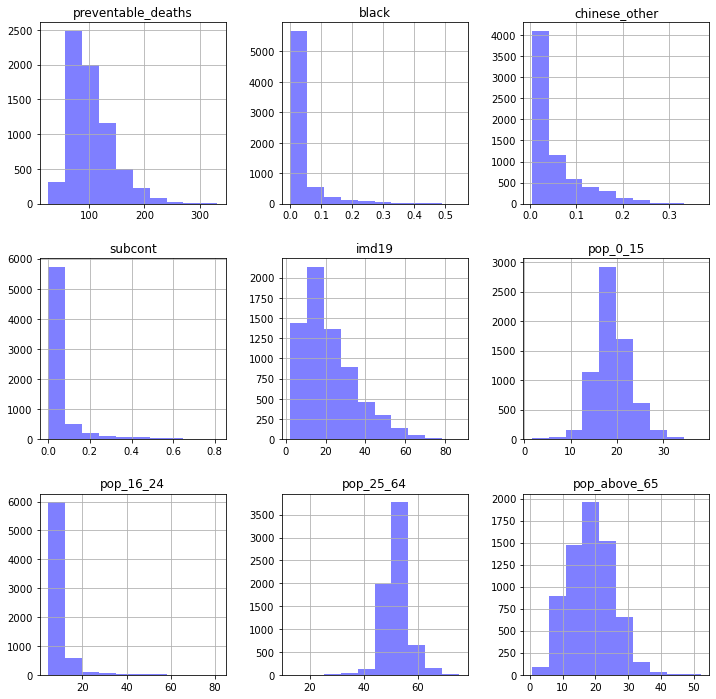

In [62]:
# histograms of the original variables - pre-transformation

#sns.pairplot(gdf_vars, markers=".", height=3, diag_kind='kde');

gdf_vars.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);

plt.savefig('plots/variable_hist.png', bbox_inches='tight')

Showing just the transformation (i.e., without standardisation): Yeo-Johnson then log.

In [63]:
#gdf_varsYeo = gdf_vars1.copy()
#for c in gdf_varsYeo.columns.values:
#    gdf_varsYeo[c] = pts1.fit_transform(gdf_varsYeo[c].values.reshape(-1,1))
#gdf_varsYeo.head(3)

In [64]:
#gdf_varsYeo.hist(layout=(3, 3), figsize=(12, 12), color='orange', alpha=0.5);
#plt.savefig('plots/yeoJohnson_variable_hist.png', bbox_inches='tight')

In [65]:
#gdf_varsLog = gdf_vars1.copy()
#for c in gdf_varsLog.columns.values:
#    gdf_varsLog[c] = np.log(gdf_varsLog[c].values.reshape(-1,1))
#gdf_varsLog.head(3)

In [66]:
#gdf_varsLog.hist(layout=(3, 3), figsize=(12, 12), color='green', alpha=0.5);
#plt.savefig('plots/log_variable_hist.png', bbox_inches='tight')

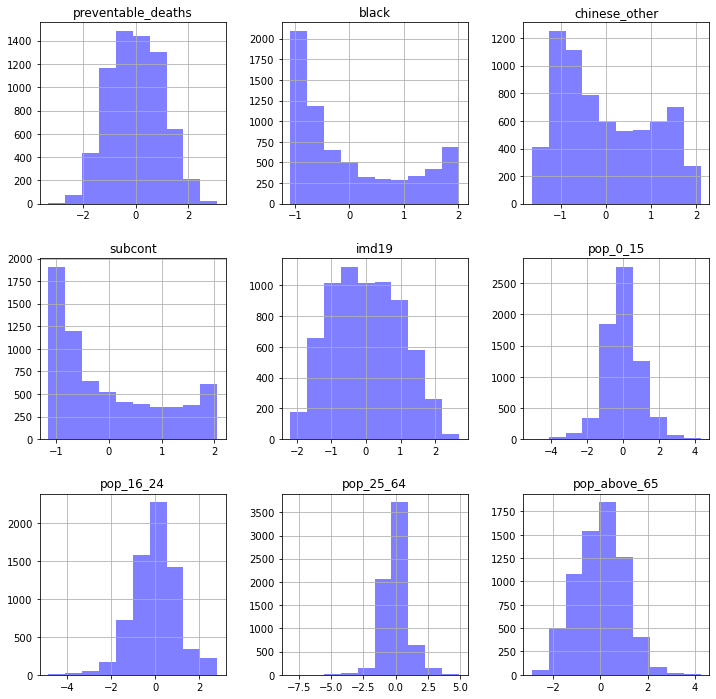

In [67]:
# standard scaler (z-score) + yeo-johnson transformation

#sns.pairplot(gdf_vars11, markers=".", height=3, diag_kind='kde');

gdf_vars11.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);

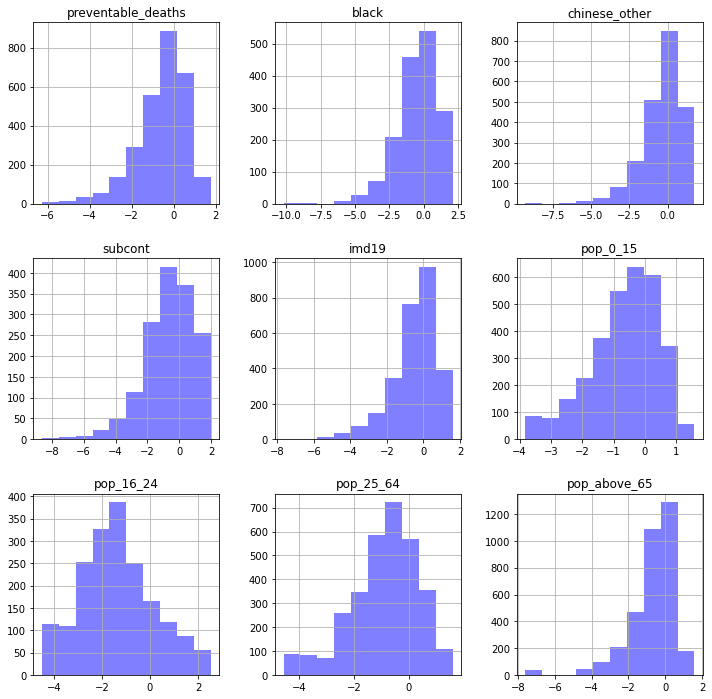

In [68]:
# standard scaler (z-score) + log transformation

#sns.pairplot(gdf_vars12, markers=".", height=3, diag_kind='kde');

gdf_vars12.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);

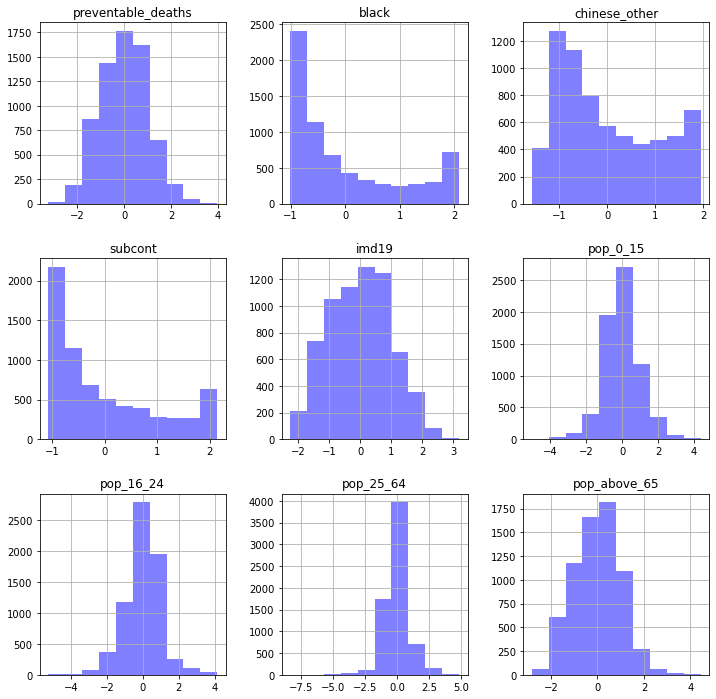

In [69]:
# IQR (robust scaler) + yeo-johnson transformation

#sns.pairplot(gdf_vars21, markers=".", height=3, diag_kind='kde');

gdf_vars21.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);


/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Datas

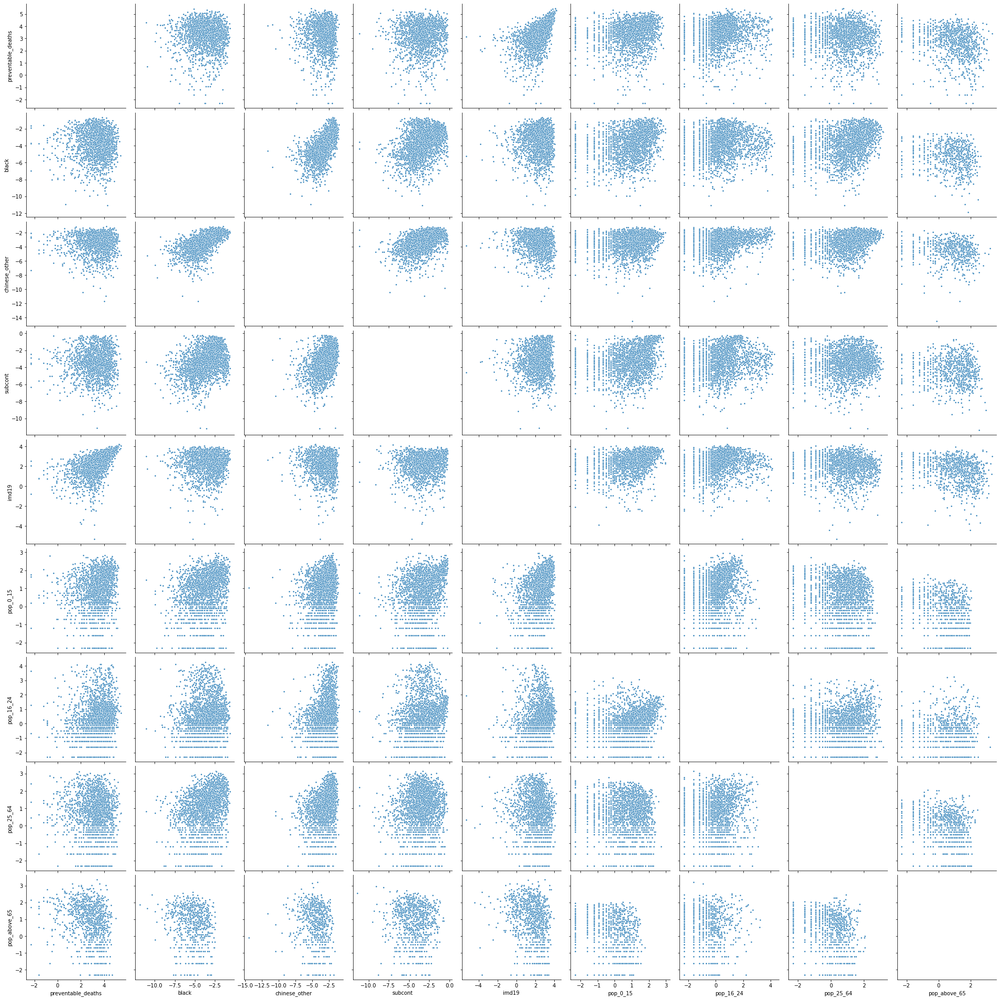

In [70]:
# IQR (robust scaler) + log transformation

#gdf_vars22.hist(layout=(3, 4), figsize=(12, 12), color='blue', alpha=0.5);
#### produces this ValueError: supplied range of [-inf, 5.46763811116474] is not finite###

# the kde below also shows the issue
sns.pairplot(gdf_vars22, markers=".", height=3, diag_kind='kde');

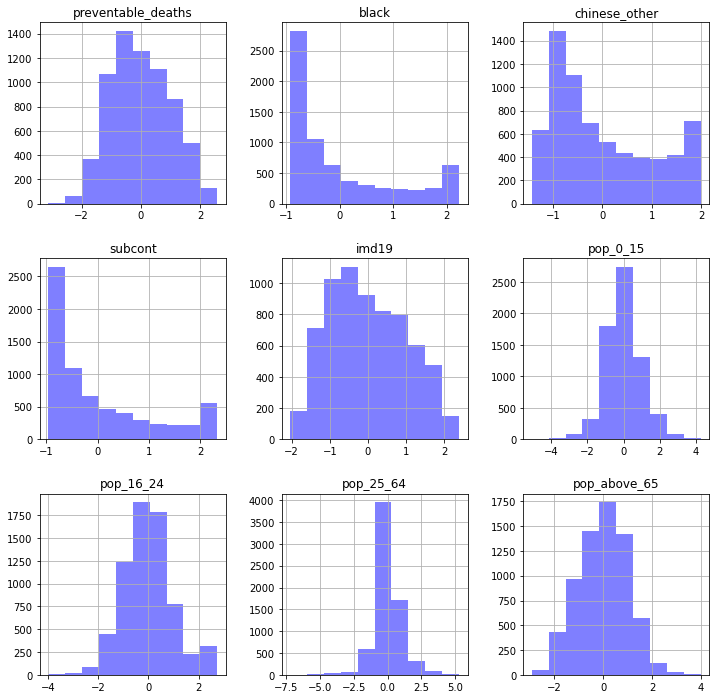

In [71]:
# MinMax scaler + yeo-johnson transformation

#sns.pairplot(gdf_vars31, markers=".", height=3, diag_kind='kde');

gdf_vars31.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);


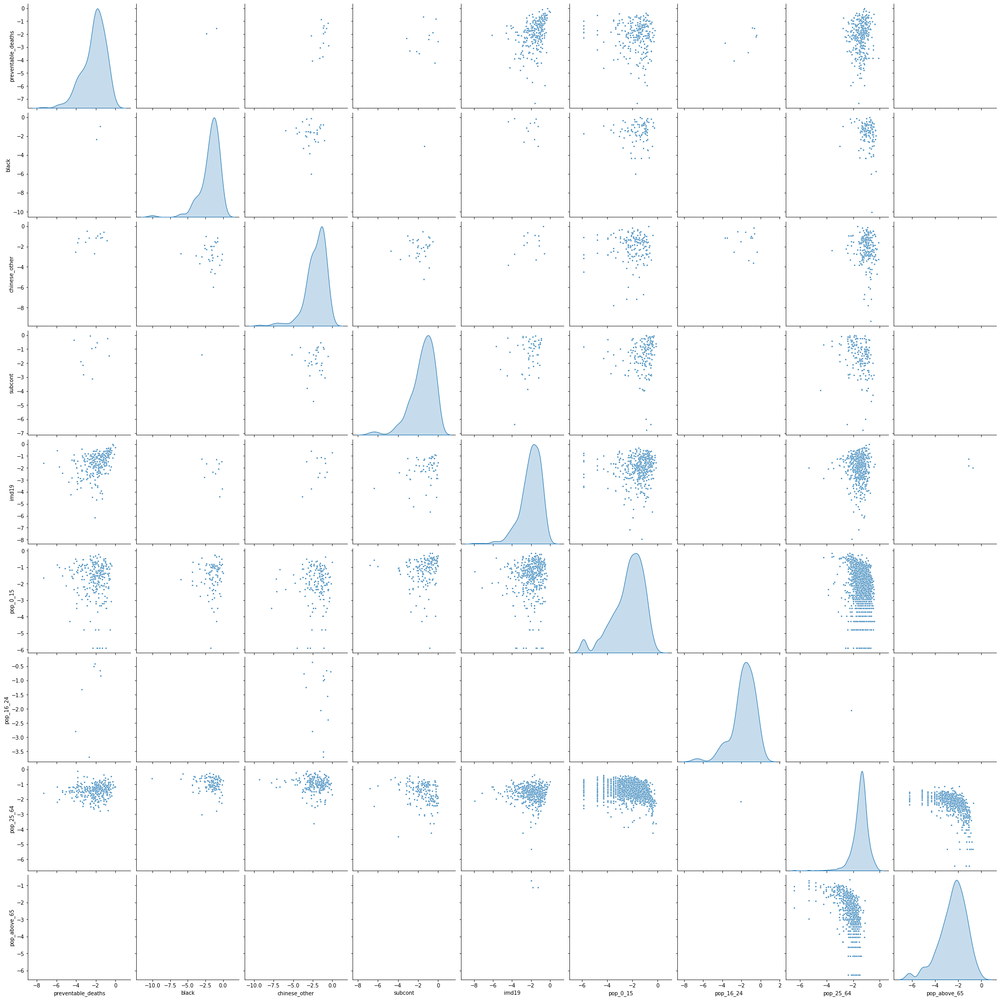

In [72]:
# MinMax scaler + log transformation

#gdf_vars32.hist(layout=(3, 4), figsize=(12, 12), color='blue', alpha=0.5);
#### produces this ValueError: supplied range of [-inf, -2.2204460492503136e-16] is not finite ###

# the kde below also shows the issue
sns.pairplot(gdf_vars32, markers=".", height=3, diag_kind='kde');

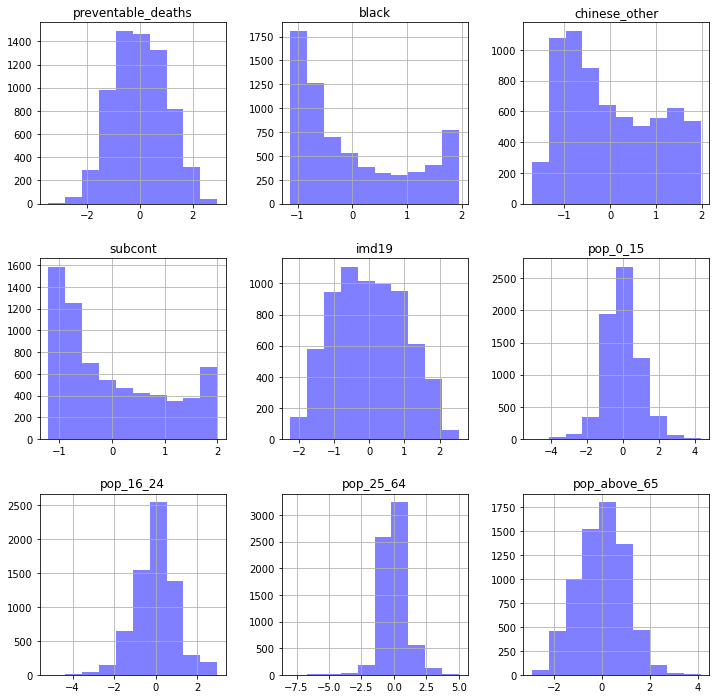

In [73]:
# IDR (robust scaler) + yeo-johnson transformation
#sns.pairplot(gdf_vars41, markers=".", height=3, diag_kind='kde');

gdf_vars41.hist(layout=(3, 3), figsize=(12, 12), color='blue', alpha=0.5);


/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/opt/conda/envs/sds2020/lib/python3.7/site-packages/seaborn/distributions.py:305: UserWarning: Datas

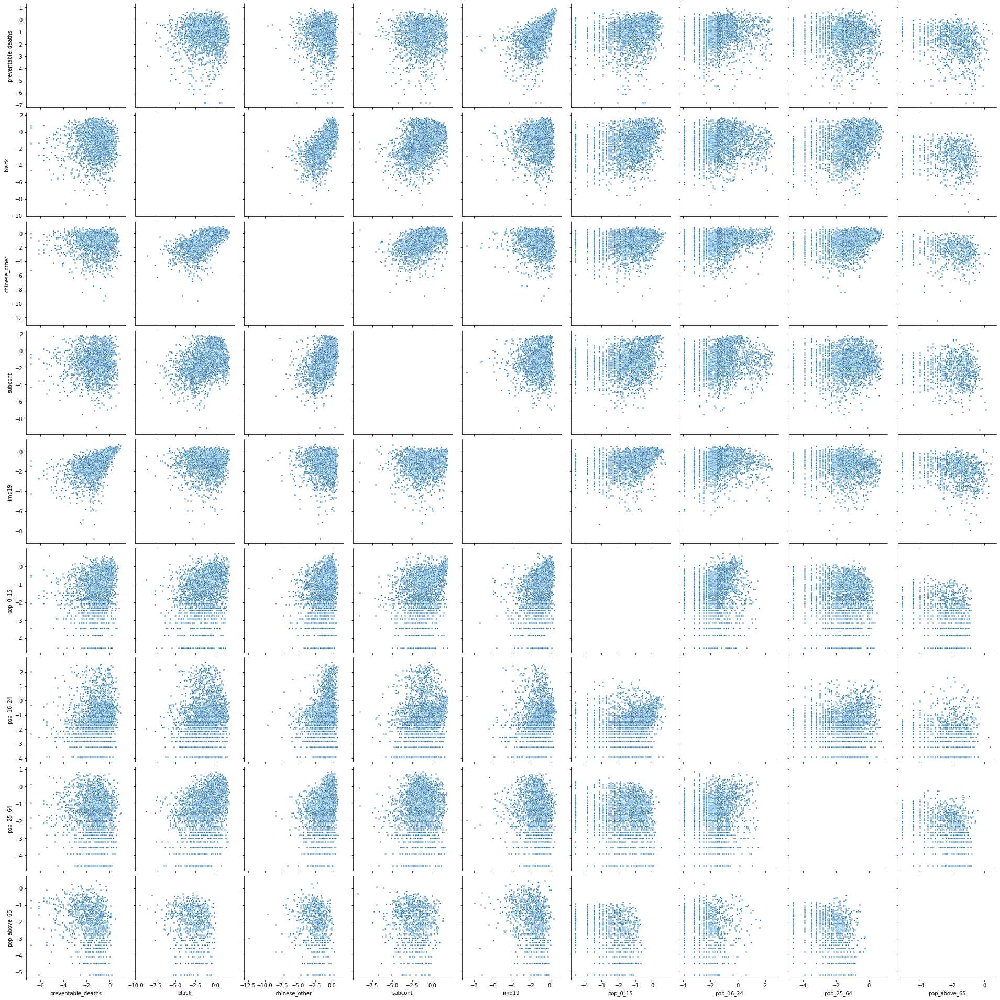

In [74]:
# IDR (robust scaler) + log transformation

#gdf_vars42.hist(layout=(3, 4), figsize=(12, 12), color='blue', alpha=0.5);
#### produces the ValueError: supplied range of [-inf, 0.9480258135382953] is not finite

# the kde below also shows the issue
sns.pairplot(gdf_vars42, markers=".", height=3, diag_kind='kde');

### The 'standard scaler (z-score) + log transformation' seems to have made the most variables as gaussian as possible. We will proceed with this dataset.

In [75]:
# We also create a 'result set' (rs) data frame to hold the 
# results of the clustering operation
rs = pd.merge(msoas, gdf_vars12, left_on='MSOA11CD', right_index=True).set_index('MSOA11CD')

## First K-Means Clustering
#### Let's see what 6 clusters looks like

In [76]:
gdf_vars12.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,nan,nan,0.27,-2.18,nan,nan,nan,-0.00,-2.14
E02000002,nan,0.76,-0.26,-1.04,-0.00,0.76,-4.51,nan,nan
E02000003,nan,0.71,-0.00,0.26,-1.31,0.14,nan,-0.75,nan


In [77]:
gdf_vars12 = gdf_vars12.fillna(0)
gdf_vars12.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
MSOA11CD,,,,,,,,,
E02000001,0.00,0.00,0.27,-2.18,0.00,0.00,0.00,-0.00,-2.14
E02000002,0.00,0.76,-0.26,-1.04,-0.00,0.76,-4.51,0.00,0.00
E02000003,0.00,0.71,-0.00,0.26,-1.31,0.14,0.00,-0.75,0.00


In [78]:
c_nm   = 'KMeans6' # Clustering name
k_pref = 6 # Number of clusters

kmeans = KMeans(n_clusters=k_pref, n_init=25, random_state=42).fit(gdf_vars12) # The process
print(kmeans.labels_) # The results

[4 2 3 ... 3 0 3]


Capture the cluster centers for our table:

In [79]:
centers = kmeans.cluster_centers_
print(centers)
print(type(centers))

[[-1.59619277 -0.07992969 -0.08129813 -0.06662788 -1.4845882  -0.39366267
  -0.1155938  -0.21123089 -0.19893921]
 [-0.13497468 -0.10998577 -0.12822248 -0.02646365 -0.08503664 -0.21894623
  -0.20926342 -2.51621083 -0.51423493]
 [-0.0531887  -0.12675013 -0.15395286  0.00381336 -0.04503363 -0.22080063
  -2.69495006 -0.38370686 -0.15555438]
 [-0.00460181 -0.09722469 -0.08980423  0.03129655 -0.00451057 -0.21512336
  -0.02054488 -0.07095549 -0.05797484]
 [-0.17817735 -0.36434384 -0.23918188 -2.72298431 -0.24109146 -0.33007427
  -0.17715087 -0.19119657 -0.17803107]
 [-0.29649251 -0.09405772 -0.19193152 -0.06363751 -0.20751929 -1.13227889
  -0.0967091  -0.6436809  -2.83536295]]
<class 'numpy.ndarray'>


In [80]:
# https://datatofish.com/numpy-array-to-pandas-dataframe/
# convert the array to a dataframe

six_clusters = pd.DataFrame(centers, columns = gdf_vars.columns, index = ['Cluster 1 Center','Cluster 2 Center','Cluster 3 Center', 'Cluster 4 Center', 'Cluster 5 Center', 'Cluster 6 Center'])
print(six_clusters)

                  preventable_deaths  black  chinese_other  subcont  imd19  \
Cluster 1 Center               -1.60  -0.08          -0.08    -0.07  -1.48   
Cluster 2 Center               -0.13  -0.11          -0.13    -0.03  -0.09   
Cluster 3 Center               -0.05  -0.13          -0.15     0.00  -0.05   
Cluster 4 Center               -0.00  -0.10          -0.09     0.03  -0.00   
Cluster 5 Center               -0.18  -0.36          -0.24    -2.72  -0.24   
Cluster 6 Center               -0.30  -0.09          -0.19    -0.06  -0.21   

                  pop_0_15  pop_16_24  pop_25_64  pop_above_65  
Cluster 1 Center     -0.39      -0.12      -0.21         -0.20  
Cluster 2 Center     -0.22      -0.21      -2.52         -0.51  
Cluster 3 Center     -0.22      -2.69      -0.38         -0.16  
Cluster 4 Center     -0.22      -0.02      -0.07         -0.06  
Cluster 5 Center     -0.33      -0.18      -0.19         -0.18  
Cluster 6 Center     -1.13      -0.10      -0.64         -2.84 

In [81]:
#https://note.nkmk.me/en/python-pandas-t-transpose/#:~:text=Use%20the%20T%20attribute%20or,columns%20swapped%20(%3D%20transposed%20object).
# Need to transpose the dataframe (swap the comuns and rows) to get it into desired format

six_clusters = six_clusters.T
print(six_clusters)

                    Cluster 1 Center  Cluster 2 Center  Cluster 3 Center  \
preventable_deaths             -1.60             -0.13             -0.05   
black                          -0.08             -0.11             -0.13   
chinese_other                  -0.08             -0.13             -0.15   
subcont                        -0.07             -0.03              0.00   
imd19                          -1.48             -0.09             -0.05   
pop_0_15                       -0.39             -0.22             -0.22   
pop_16_24                      -0.12             -0.21             -2.69   
pop_25_64                      -0.21             -2.52             -0.38   
pop_above_65                   -0.20             -0.51             -0.16   

                    Cluster 4 Center  Cluster 5 Center  Cluster 6 Center  
preventable_deaths             -0.00             -0.18             -0.30  
black                          -0.10             -0.36             -0.09  
chinese_other 

Now capture the labels (i.e. clusters) and write them to a data series that we store on the result set df (`rs`):

In [82]:
# Add it to the data frame
rs[c_nm] = pd.Series(kmeans.labels_, index=gdf_vars12.index)

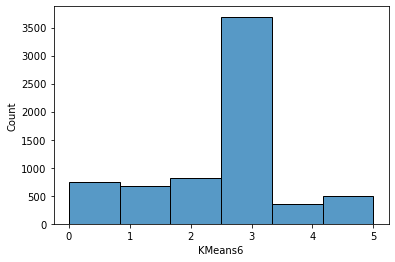

In [83]:
# How are the clusters distributed?
ax = sns.histplot(data=rs, x=c_nm, bins=k_pref);

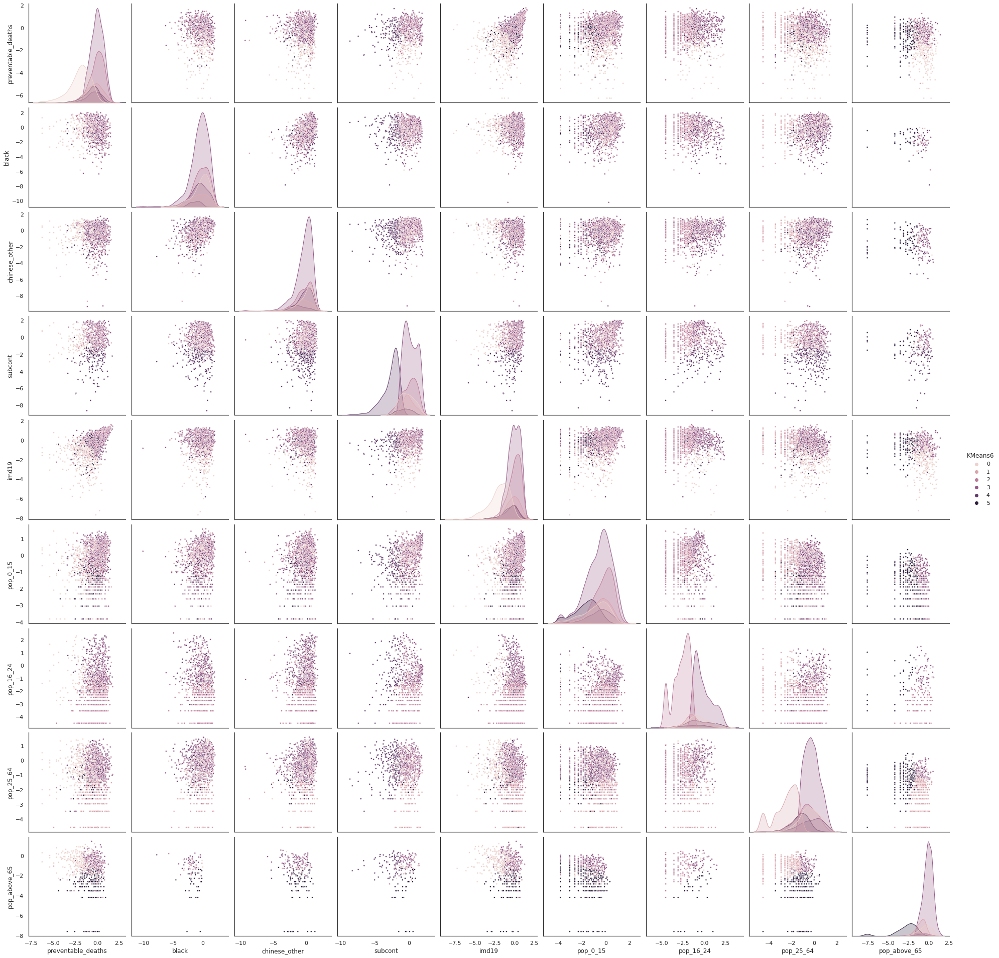

In [84]:
# There are 'only' 10 variables to plot so we'll plot them all against each other plot every variable against every
sns.set(style="white")
sns.pairplot(rs, 
             vars=gdf_vars.columns, 
             hue=c_nm, markers=".", height=3, diag_kind='kde');

And here's a map!

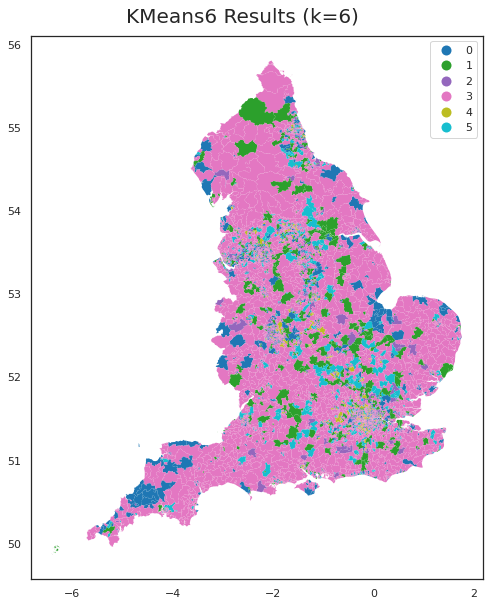

In [85]:
fig, ax = plt.subplots(figsize=(16,10))
fig.suptitle(f"{c_nm} Results (k={k_pref})", fontsize=20, y=0.92)
rs.plot(column=c_nm, ax=ax, linewidth=0, zorder=0, categorical=True, legend=True);

#### The 'Right' Number of Clusters

There's more than one way to find the 'right' number of clusters. In Singleton's _Geocomputation_ chapter they use WCSS to pick the 'optimal' number of clusters. The idea is that you plot the average WCSS for each number of possible clusters in the range of interest (2...n) and then look for a 'knee' (i.e. kink) in the curve. The principle of this approach is that you look for the point where there is declining benefit from adding more clusters. The problem is that there is always some benefit to adding more clusters (the perfect clustering is k==n), so you don't always see a knee.

Another way to try to make the process of selecting the number of clusters a little less arbitrary is called the silhouette plot and (like WCSS) it allows us to evaluate the 'quality' of the clustering outcome by examining the distance between each observation and the rest of the cluster. In this case it's based on Partitioning Around the Medoid (PAM).

Either way, to evaluate this in a systematic way, we want to do multiple k-means clusterings for multiple values of k and then we can look at which gives the best results...

Let's try clustering across a wider range.

.........
Largest silhouette score was 0.2991 for k=10


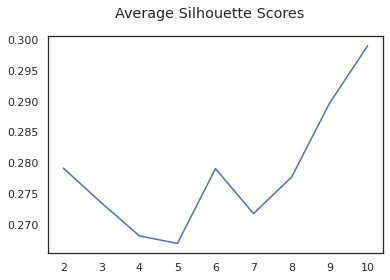

In [86]:
# Adapted from: http://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html
from sklearn.metrics import davies_bouldin_score, silhouette_samples, silhouette_score

x = []
y = []

for k in range(2,11):
    
    #############
    # Do the clustering using the main columns
    kmeans = KMeans(n_clusters=k, n_init=25, random_state=42).fit(gdf_vars12)
    
    # Calculate the overall silhouette score
    silhouette_avg = silhouette_score(gdf_vars12, kmeans.labels_)
    
    y.append(k)
    x.append(silhouette_avg)
    
    print('.', end='')

print()
print(f"Largest silhouette score was {max(x):6.4f} for k={y[x.index(max(x))]}")

plt.plot(y, x)
plt.gcf().suptitle("Average Silhouette Scores");

In [87]:
#https://realpython.com/k-means-clustering-python/
# SSE ELBOW METHOD 

In [88]:
# A list holds the SSE values for each k
sse1 = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, n_init=25, random_state=42)
    kmeans.fit(gdf_vars12)
    sse1.append(kmeans.inertia_)

In [89]:
print(sse1)

[45149.72085537526, 39461.64299573749, 34837.698628658494, 31972.93430170135, 29412.589337004647, 27240.323790818085, 25201.213521852616, 23432.657976731505, 21728.478164474327, 20422.436603347163]


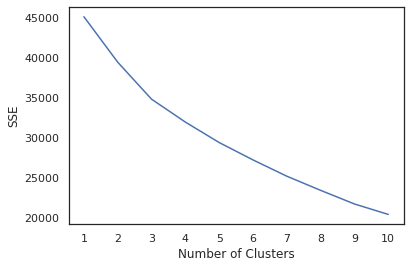

In [90]:
#plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse1)
plt.xticks(range(1, 11))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
#plt.title('SSE Curve for PowerTransformed Clusters')

plt.savefig('plots/sseCurve.png', bbox_inches='tight')
plt.show()

In [91]:
#SILHOUTTE COEFFICIENT 

In [92]:
silhouette_coefficients1 = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, n_init=25, random_state=42)
    kmeans.fit(gdf_vars12)
    score = silhouette_score(gdf_vars12, kmeans.labels_)
    silhouette_coefficients1.append(score)

In [93]:
print(silhouette_coefficients1)

[0.2791910450648448, 0.27355282049270624, 0.2681719373585009, 0.2669449362402717, 0.2790982862658101, 0.2717949953917419, 0.2777253420747079, 0.2897581416873008, 0.2990792559686786]


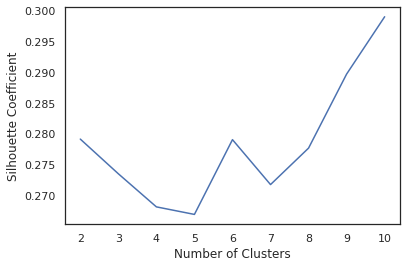

In [94]:
#plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients1)
plt.xticks(range(2, 11)) 
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
#plt.title('Silhouette Coefficient Plot for ..... Clusters')
plt.savefig('plots/SilhouetteCoef_graph.png', bbox_inches='tight')
plt.show()


In [95]:
# Davies-Bouldin Index

In [96]:
db_index = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, n_init=25, random_state=42)
    kmeans.fit(gdf_vars12)
    
    value = davies_bouldin_score(gdf_vars12,kmeans.labels_)
    db_index.append(value)

In [97]:
print(db_index)

[1.7753928382745567, 1.7336149465348283, 1.72944835849762, 1.5923045096186323, 1.5075678039380722, 1.420933420495506, 1.4019251756102742, 1.3332132704871624, 1.1505440632314148]


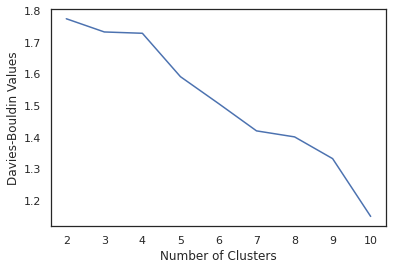

In [98]:
#plt.style.use("fivethirtyeight")
plt.plot(range(2,11), db_index)
plt.xticks(range(2, 11)) 
plt.xlabel("Number of Clusters")
plt.ylabel("Davies-Bouldin Values")
plt.savefig('plots/dbIndex_graph.png', bbox_inches='tight')
plt.show()

In [99]:
# 10 clusters appear to be 'optimal'
# How we justify our selection of whatever number of clusters is the question

## Second K-Means Clustering
#### Let's see what the 10 'optimal' clusters look like

In [100]:
c_nm10   = 'KMeans10' # Clustering name
k_pref = 10 # Number of clusters

kmeans10 = KMeans(n_clusters=k_pref, n_init=25, random_state=42).fit(gdf_vars12) # The process

print(kmeans10.labels_)

[1 4 3 ... 3 9 3]


Capture the cluster centers for our table:

In [101]:
centers10 = kmeans10.cluster_centers_
#print(centers10)

In [102]:
# https://datatofish.com/numpy-array-to-pandas-dataframe/
# convert the array to a dataframe

#ten_clusters = pd.DataFrame(centers10, columns = gdf_vars.columns, index = ['Cluster 1 Center','Cluster 2 Center',
#                                                                               'Cluster 3 Center', 'Cluster 4 Center', 
#                                                                               'Cluster 5 Center', 'Cluster 6 Center', 
#                                                                               'Cluster 7 Center','Cluster 8 Center',
#                                                                               'Cluster 9 Center', 'Cluster 10 Center'])
#print(ten_clusters)

In [103]:
#https://note.nkmk.me/en/python-pandas-t-transpose/#:~:text=Use%20the%20T%20attribute%20or,columns%20swapped%20(%3D%20transposed%20object).
# Need to transpose the dataframe (swap the comuns and rows) to get it into desired format

#ten_clusters = ten_clusters.T
#print(ten_clusters)

Now capture the labels (i.e. clusters) and write them to a data series that we store on the result set df (`rs`):

In [104]:
# Add it to the data frame
rs[c_nm10] = pd.Series(kmeans10.labels_, index=gdf_vars12.index)

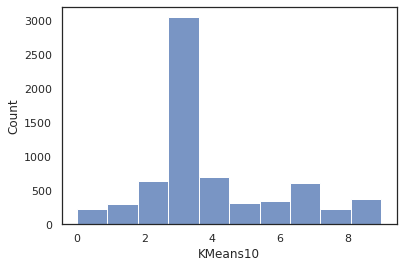

In [105]:
# How are the clusters distributed?
ax = sns.histplot(data=rs, x=c_nm10, bins=k_pref);

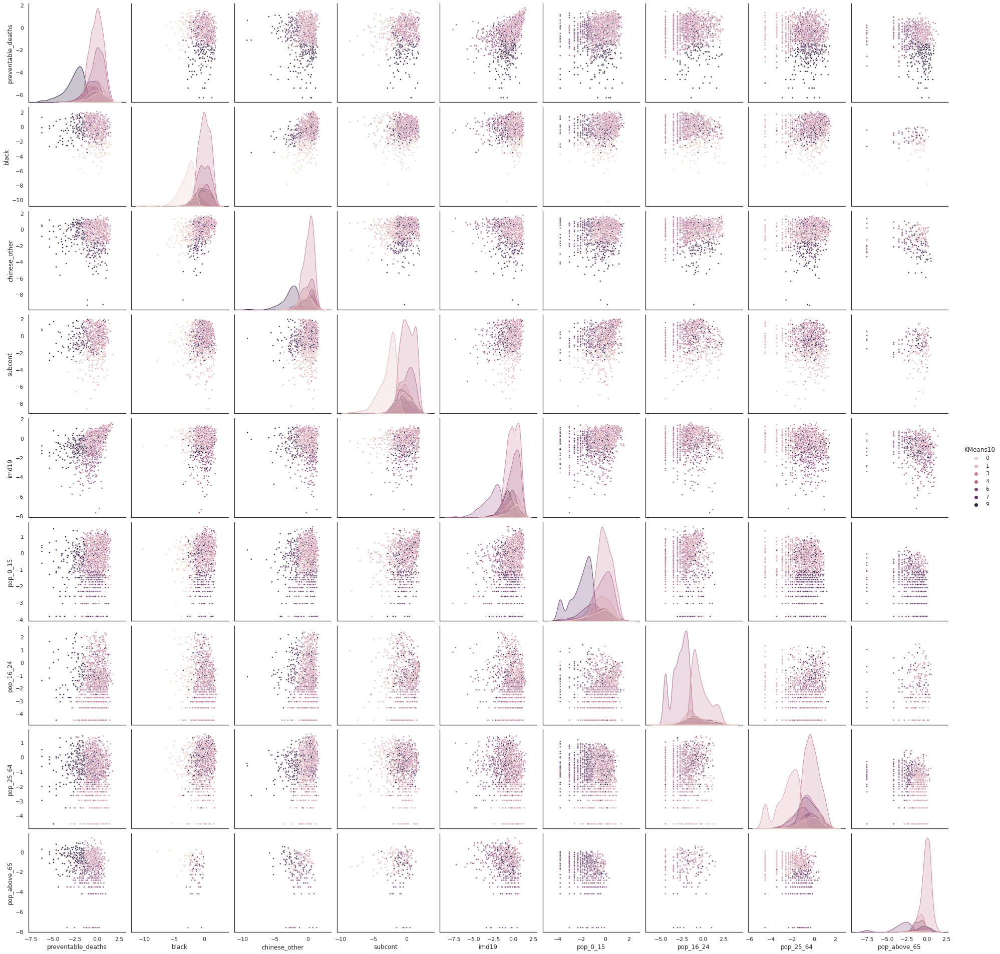

In [106]:
# There are 'only' 10 variables to plot so we'll plot them all against each other plot every variable against every
sns.set(style="white")
sns.pairplot(rs, 
             vars=gdf_vars.columns, 
             hue=c_nm10, markers=".", height=3, diag_kind='kde');

And here's a map!

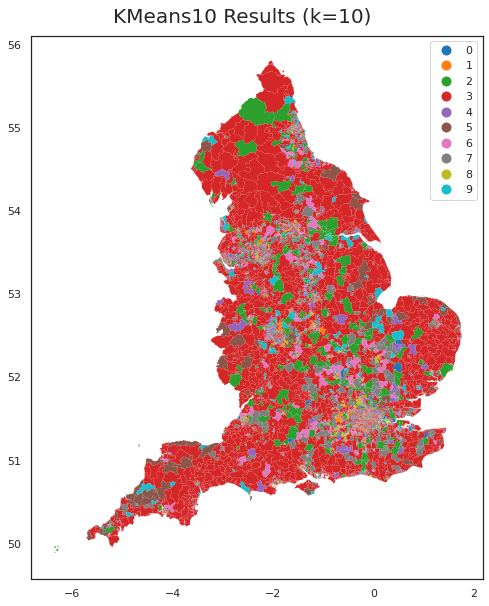

In [107]:
fig, ax = plt.subplots(figsize=(16,10))
fig.suptitle(f"{c_nm10} Results (k={k_pref})", fontsize=20, y=0.92)
rs.plot(column=c_nm10, ax=ax, linewidth=0, zorder=0, categorical=True, legend=True);

## Third K-Means Clustering
#### Let's see what  7 clusters look like

In [108]:
c_nm7   = 'KMeans7' # Clustering name
k_pref = 7 # Number of clusters

kmeans7 = KMeans(n_clusters=k_pref, n_init=25, random_state=42).fit(gdf_vars12) # The process

print(kmeans7.labels_)

[4 2 3 ... 3 0 3]


In [109]:
# capture cluster centers
centers7 = kmeans7.cluster_centers_
print(centers7)

[[-1.64178031e+00 -1.12323365e-01 -7.69334008e-02 -7.03574776e-02
  -1.55890455e+00 -1.94238550e-01 -1.13731322e-01 -2.16953894e-01
  -2.04967109e-01]
 [-1.40485781e-01 -1.10491174e-01 -1.32438287e-01 -2.43881500e-02
  -8.83827932e-02 -1.46773249e-01 -1.96845320e-01 -2.51595095e+00
  -5.39509523e-01]
 [-5.55020777e-02 -1.27019859e-01 -1.48143446e-01 -8.91674337e-04
  -4.90660278e-02 -1.57802597e-01 -2.72544719e+00 -3.97739450e-01
  -1.55794589e-01]
 [-4.25445811e-03 -7.72797310e-02 -8.26119092e-02  3.83956845e-02
  -2.27704697e-03  5.25215747e-04 -2.39101481e-02 -4.91012126e-02
  -4.17637299e-02]
 [-1.83899905e-01 -3.42156091e-01 -2.34140591e-01 -2.78155507e+00
  -2.52891310e-01 -2.55128626e-01 -1.87553876e-01 -1.97534212e-01
  -1.77653887e-01]
 [-3.33277766e-01 -1.15894603e-01 -2.14050307e-01 -7.93778517e-02
  -2.36652757e-01 -8.16399559e-01 -1.27283216e-01 -7.88152555e-01
  -3.27212484e+00]
 [-1.91487840e-01 -1.69117423e-01 -1.48951423e-01 -5.80677660e-02
  -1.42147442e-01 -2.0827418

In [110]:
#create df of cluster centers
centers7 = pd.DataFrame(centers7)
centers7.head()

,0,1,2,3,4,5,6,7,8
0,-1.64,-0.11,-0.08,-0.07,-1.56,-0.19,-0.11,-0.22,-0.20
1,-0.14,-0.11,-0.13,-0.02,-0.09,-0.15,-0.20,-2.52,-0.54
2,-0.06,-0.13,-0.15,-0.00,-0.05,-0.16,-2.73,-0.40,-0.16
3,-0.00,-0.08,-0.08,0.04,-0.00,0.00,-0.02,-0.05,-0.04
4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18


In [111]:
centers7.shape

(7, 9)

In [112]:
# assign cluster labels to each MSOA
gdf_vars12 = gdf_vars12.assign(label_7clusters = kmeans7.labels_)
gdf_vars12.head()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,label_7clusters
MSOA11CD,,,,,,,,,,
E02000001,0.00,0.00,0.27,-2.18,0.00,0.00,0.00,-0.00,-2.14,4
E02000002,0.00,0.76,-0.26,-1.04,-0.00,0.76,-4.51,0.00,0.00,2
E02000003,0.00,0.71,-0.00,0.26,-1.31,0.14,0.00,-0.75,0.00,3
E02000004,-1.68,0.14,-1.86,0.00,-1.90,-1.38,-0.70,0.00,0.00,0
E02000005,-4.64,0.77,-0.92,-0.88,-0.43,0.72,-2.13,-2.61,0.00,0


In [113]:
# merge the MSOA df that has the variable values and cluster labels with the cluster centers
vars12_w_centres = pd.merge(gdf_vars12, centers7, left_on = 'label_7clusters', right_index = True)

In [114]:
vars12_w_centres.head()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,label_7clusters,0,1,2,3,4,5,6,7,8
MSOA11CD,,,,,,,,,,,,,,,,,,,
E02000001,0.00,0.00,0.27,-2.18,0.00,0.00,0.00,-0.00,-2.14,4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18
E02000008,-0.79,0.80,-0.78,-4.82,-0.03,0.61,-1.99,0.00,0.00,4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18
E02000018,-0.77,0.97,-0.48,-1.56,0.12,0.87,-1.21,0.00,0.00,4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18
E02000019,0.00,1.09,-0.83,-2.11,-0.23,0.78,-1.57,0.00,0.00,4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18
E02000021,-0.84,1.37,-0.95,-1.71,-0.26,0.86,-1.57,0.00,0.00,4,-0.18,-0.34,-0.23,-2.78,-0.25,-0.26,-0.19,-0.20,-0.18


In [115]:
vars12_w_centres.columns

Index(['preventable_deaths',              'black',      'chinese_other',
                  'subcont',              'imd19',           'pop_0_15',
                'pop_16_24',          'pop_25_64',       'pop_above_65',
          'label_7clusters',                    0,                    1,
                          2,                    3,                    4,
                          5,                    6,                    7,
                          8],
      dtype='object')

In [116]:
msoa_cols = ['preventable_deaths','black', 'chinese_other',
             'subcont','imd19','pop_0_15',
            'pop_16_24','pop_25_64','pop_above_65']
cluster_cols = [0, 1, 2, 3, 4, 5, 6, 7, 8]

In [117]:
for i in cluster_cols:
    col_name = "diff_" + str(i)
    vars12_w_centres[col_name] = np.square(vars12_w_centres[msoa_cols[i]] - vars12_w_centres[cluster_cols[i]])
cols_to_sum = [vars12_w_centres["diff_0"], vars12_w_centres["diff_1"], vars12_w_centres["diff_2"], 
               vars12_w_centres["diff_3"], vars12_w_centres["diff_4"], vars12_w_centres["diff_5"], 
               vars12_w_centres["diff_6"], vars12_w_centres["diff_7"], vars12_w_centres["diff_8"]]
vars12_w_centres['sse'] = sum(cols_to_sum)

In [118]:
vars12_w_centres.head(3)

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,label_7clusters,...,diff_0,diff_1,diff_2,diff_3,diff_4,diff_5,diff_6,diff_7,diff_8,sse
MSOA11CD,,,,,,,,,,,,,,,,,,,,,
E02000001,0.00,0.00,0.27,-2.18,0.00,0.00,0.00,-0.00,-2.14,4,...,0.03,0.12,0.26,0.36,0.06,0.07,0.04,0.04,3.86,4.84
E02000008,-0.79,0.80,-0.78,-4.82,-0.03,0.61,-1.99,0.00,0.00,4,...,0.36,1.31,0.30,4.16,0.05,0.75,3.25,0.04,0.03,10.26
E02000018,-0.77,0.97,-0.48,-1.56,0.12,0.87,-1.21,0.00,0.00,4,...,0.34,1.72,0.06,1.50,0.14,1.26,1.05,0.04,0.03,6.13


### Boxplots showing the distribution of total within sum of squares by cluster group


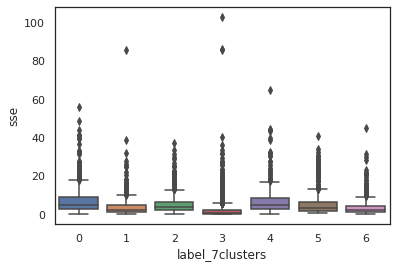

In [119]:
ax = sns.boxplot(x = 'label_7clusters', y = 'sse', data = vars12_w_centres)

### Assign the labels to original (UNSTANDARDISED/TRANSFORMED) dataframe


In [120]:
gdf_vars_kmeans = gdf_vars.assign(label_7clusters = kmeans7.labels_)
gdf_vars_kmeans.head()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,label_7clusters
MSOA11CD,,,,,,,,,,
E02000001,68.50,0.03,0.12,0.06,14.72,15.10,9.00,56.60,19.40,4
E02000002,93.60,0.17,0.10,0.09,34.77,27.40,10.60,48.30,13.70,2
E02000003,101.80,0.16,0.11,0.19,25.15,23.50,10.20,54.10,12.20,3
E02000004,110.70,0.10,0.06,0.02,23.56,20.00,13.30,50.40,16.30,0
E02000005,103.90,0.17,0.07,0.09,30.21,27.00,11.20,52.20,9.60,0


In [121]:
#gdf_vars_kmeans.columns

In [122]:
gdf_vars_kmeans.groupby(["label_7clusters"]).sum()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
label_7clusters,,,,,,,,,
0,"71,996.20",27.06,38.66,34.22,"15,269.52","12,376.80","7,247.80","35,238.30","12,036.90"
1,"68,335.50",16.27,27.79,25.73,"13,798.97","12,812.90","6,538.20","34,802.80","12,247.80"
2,"104,477.80",43.67,53.46,62.45,"26,157.94","17,202.70","8,727.10","41,561.80","11,405.50"
3,"323,103.60",89.21,157.28,167.96,"65,252.55","60,250.80","34,996.60","168,141.60","67,106.20"
4,"34,745.90",22.22,33.64,21.01,"7,061.87","6,537.80","4,244.20","18,456.00","4,863.20"
5,"36,898.40",4.07,13.24,8.96,"6,978.29","7,165.80","3,548.30","19,480.50","7,105.10"
6,"63,496.70",18.90,34.49,27.39,"12,102.34","12,778.10","6,265.90","34,431.60","11,524.60"


In [123]:
gdf_vars_kmeans.groupby(["label_7clusters"]).count()

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
label_7clusters,,,,,,,,,
0,669,669,669,669,669,669,669,669,669
1,664,664,664,664,664,664,664,664,664
2,789,789,789,789,789,789,789,789,789
3,3305,3305,3305,3305,3305,3305,3305,3305,3305
4,341,341,341,341,341,341,341,341,341
5,373,373,373,373,373,373,373,373,373
6,650,650,650,650,650,650,650,650,650


In [124]:
#Capture the cluster centers
centers_unstan_unnorm = gdf_vars_kmeans.groupby(["label_7clusters"]).mean()
centers_unstan_unnorm

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
label_7clusters,,,,,,,,,
0,107.62,0.04,0.06,0.05,22.82,18.50,10.83,52.67,17.99
1,102.91,0.02,0.04,0.04,20.78,19.30,9.85,52.41,18.45
2,132.42,0.06,0.07,0.08,33.15,21.80,11.06,52.68,14.46
3,97.76,0.03,0.05,0.05,19.74,18.23,10.59,50.87,20.30
4,101.89,0.07,0.10,0.06,20.71,19.17,12.45,54.12,14.26
5,98.92,0.01,0.04,0.02,18.71,19.21,9.51,52.23,19.05
6,97.69,0.03,0.05,0.04,18.62,19.66,9.64,52.97,17.73


In [125]:
#https://note.nkmk.me/en/python-pandas-t-transpose/#:~:text=Use%20the%20T%20attribute%20or,columns%20swapped%20(%3D%20transposed%20object).
# Need to transpose the dataframe (swap the comuns and rows) to get it into desired format

centers_unstan_unnorm = centers_unstan_unnorm.T
print(centers_unstan_unnorm)

label_7clusters         0      1      2     3      4     5     6
preventable_deaths 107.62 102.91 132.42 97.76 101.89 98.92 97.69
black                0.04   0.02   0.06  0.03   0.07  0.01  0.03
chinese_other        0.06   0.04   0.07  0.05   0.10  0.04  0.05
subcont              0.05   0.04   0.08  0.05   0.06  0.02  0.04
imd19               22.82  20.78  33.15 19.74  20.71 18.71 18.62
pop_0_15            18.50  19.30  21.80 18.23  19.17 19.21 19.66
pop_16_24           10.83   9.85  11.06 10.59  12.45  9.51  9.64
pop_25_64           52.67  52.41  52.68 50.87  54.12 52.23 52.97
pop_above_65        17.99  18.45  14.46 20.30  14.26 19.05 17.73


In [126]:
# compute the national average of each variable
national_av = gdf_vars.mean(axis=0)
national_av

preventable_deaths   103.53
black                  0.03
chinese_other          0.05
subcont                0.05
imd19                 21.59
pop_0_15              19.01
pop_16_24             10.54
pop_25_64             51.85
pop_above_65          18.60
dtype: float64

In [127]:
national_av.to_pickle("national_av_variables.pkl")  # where to save it, usually as a .pkl


In [128]:
# Combine the national_av series with the cluster averages df
centers_unstan_unnorm['ENG'] = national_av
centers_unstan_unnorm

label_7clusters,0,1,2,3,4,5,6,ENG
preventable_deaths,107.62,102.91,132.42,97.76,101.89,98.92,97.69,103.53
black,0.04,0.02,0.06,0.03,0.07,0.01,0.03,0.03
chinese_other,0.06,0.04,0.07,0.05,0.10,0.04,0.05,0.05
subcont,0.05,0.04,0.08,0.05,0.06,0.02,0.04,0.05
imd19,22.82,20.78,33.15,19.74,20.71,18.71,18.62,21.59
pop_0_15,18.50,19.30,21.80,18.23,19.17,19.21,19.66,19.01
pop_16_24,10.83,9.85,11.06,10.59,12.45,9.51,9.64,10.54
pop_25_64,52.67,52.41,52.68,50.87,54.12,52.23,52.97,51.85
pop_above_65,17.99,18.45,14.46,20.30,14.26,19.05,17.73,18.60


In [129]:
centers_unstan_unnorm = centers_unstan_unnorm.T
centers_unstan_unnorm

,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65
label_7clusters,,,,,,,,,
0,107.62,0.04,0.06,0.05,22.82,18.50,10.83,52.67,17.99
1,102.91,0.02,0.04,0.04,20.78,19.30,9.85,52.41,18.45
2,132.42,0.06,0.07,0.08,33.15,21.80,11.06,52.68,14.46
3,97.76,0.03,0.05,0.05,19.74,18.23,10.59,50.87,20.30
4,101.89,0.07,0.10,0.06,20.71,19.17,12.45,54.12,14.26
5,98.92,0.01,0.04,0.02,18.71,19.21,9.51,52.23,19.05
6,97.69,0.03,0.05,0.04,18.62,19.66,9.64,52.97,17.73
ENG,103.53,0.03,0.05,0.05,21.59,19.01,10.54,51.85,18.60


In [130]:
# change table from wide to long for plotting
averages7 = centers_unstan_unnorm.unstack().reset_index() 
averages7.rename(columns={'level_0':'variable', 'label_7clusters':'cluster'}, inplace=True)
averages7.head()

,variable,cluster,0
0,preventable_deaths,0,107.62
1,preventable_deaths,1,102.91
2,preventable_deaths,2,132.42
3,preventable_deaths,3,97.76
4,preventable_deaths,4,101.89


In [131]:
#averages7.shape

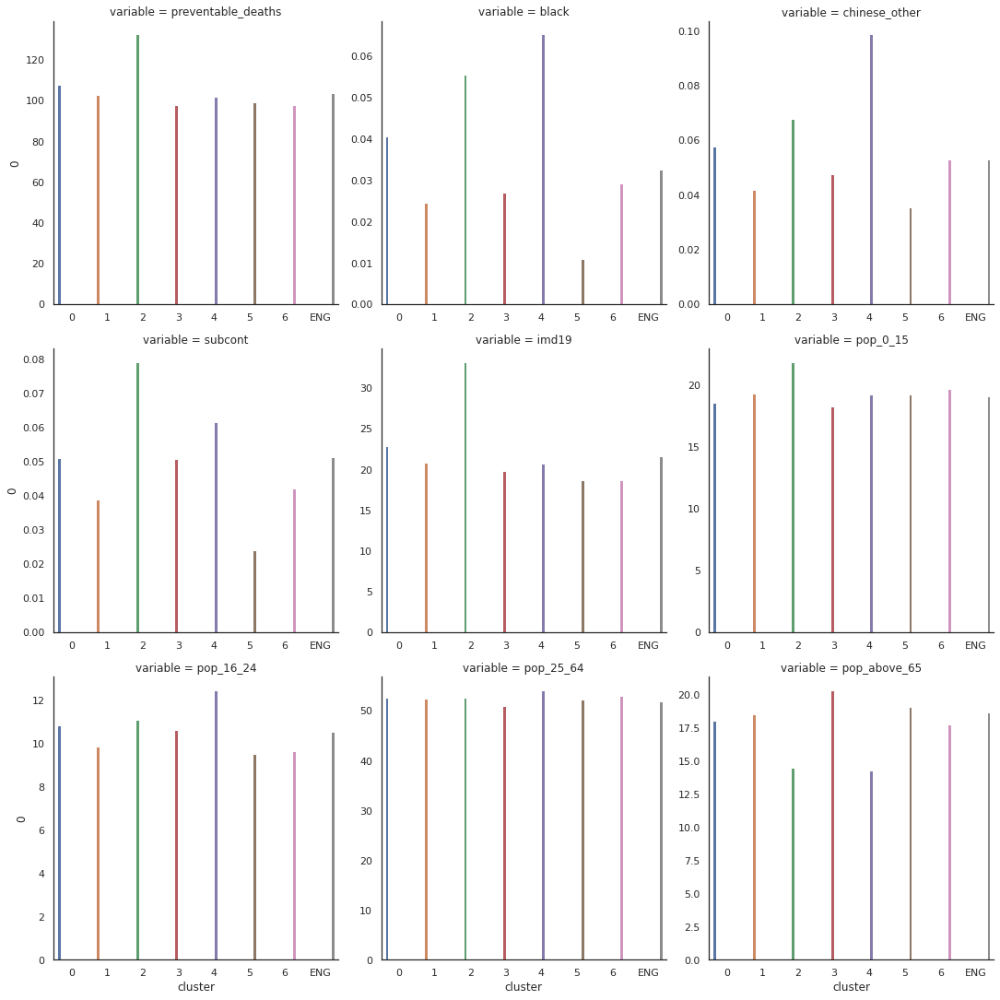

In [132]:
#https://seaborn.pydata.org/generated/seaborn.catplot.html
g = sns.catplot(data=averages7, x='cluster',y = 0, hue='cluster', col='variable', kind='bar',
                col_wrap=3, height = 5, sharex=False, sharey=False)

In [133]:
#g.savefig("Plots/log_zscore_kmeans_7.png")

Now capture the labels (i.e. clusters) and write them to a data series that we store on the result set df (`rs`):

In [134]:
# Add it to the data frame
rs[c_nm7] = pd.Series(kmeans7.labels_, index=gdf_vars12.index)

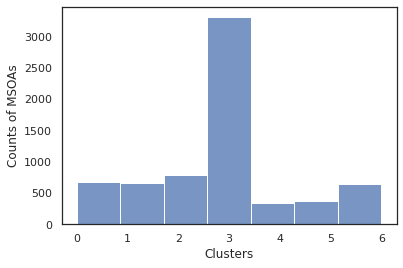

In [135]:
# How are the clusters distributed?

ax = sns.histplot(data=rs, x=c_nm7, bins=k_pref);

# rename axes laebl
ax.set_ylabel('Counts of MSOAs')    
ax.set_xlabel('Clusters')
plt.savefig('plots/MsoaClusterDistribution_ENG.png', bbox_inches='tight')


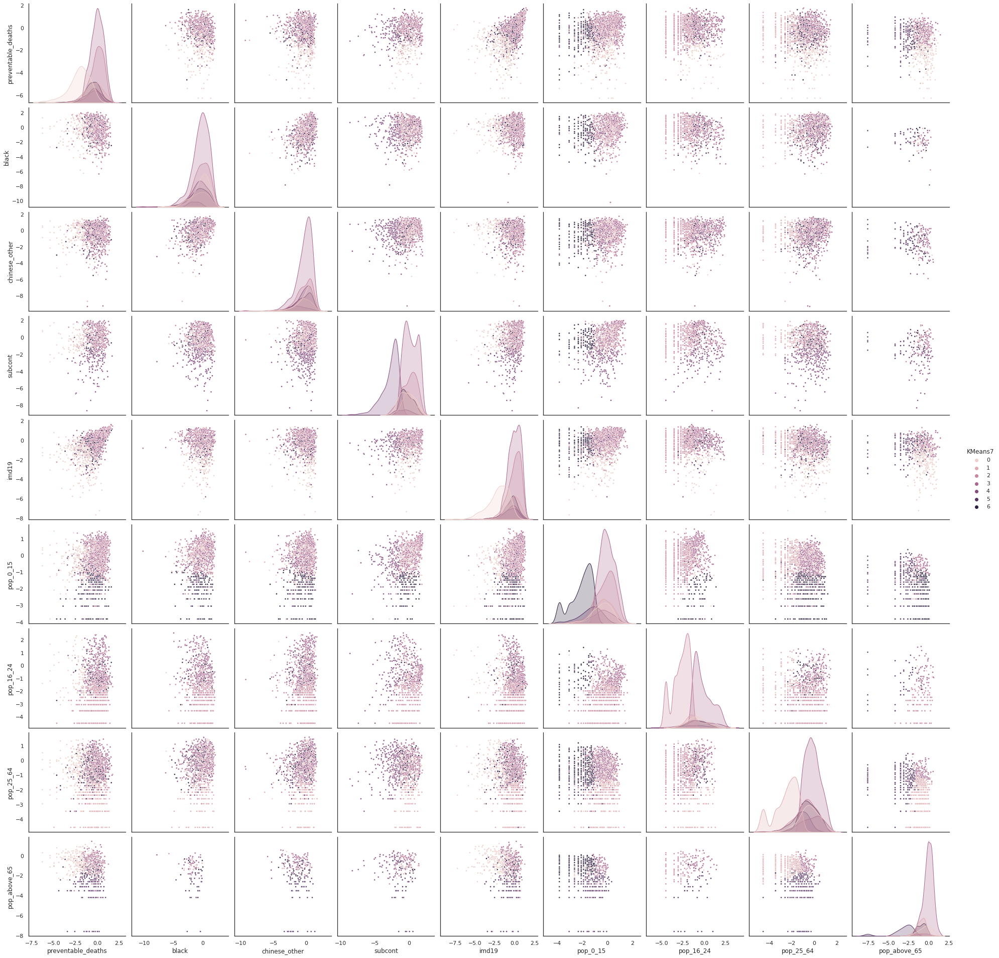

In [136]:
# There are 9 variables to plot so we'll plot them all against each other plot every variable against every
sns.set(style="white")
sns.pairplot(rs, 
             vars=gdf_vars.columns, 
             hue=c_nm7, markers=".", height=3, diag_kind='kde');

And here's a map!

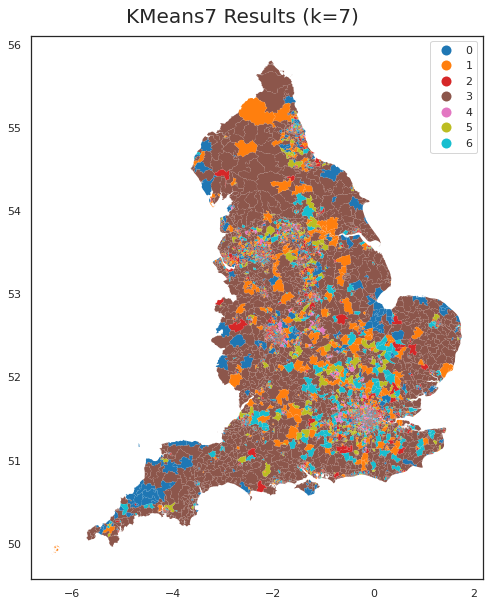

In [137]:
fig, ax = plt.subplots(figsize=(16,10))
fig.suptitle(f"{c_nm7} Results (k={k_pref})", fontsize=20, y=0.92)
rs.plot(column=c_nm7, ax=ax, linewidth=0, zorder=0, categorical=True, legend=True);

In [138]:
rs.head(3)

,OBJECTID,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,KMeans6,KMeans10,KMeans7
MSOA11CD,,,,,,,,,,,,,,,,,,,
E02000001,1,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,nan,nan,0.27,-2.18,nan,nan,nan,-0.00,-2.14,4,1,4
E02000002,2,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,nan,0.76,-0.26,-1.04,-0.00,0.76,-4.51,nan,nan,2,4,2
E02000003,3,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,nan,0.71,-0.00,0.26,-1.31,0.14,nan,-0.75,nan,3,3,3


In [139]:
# reset indx to allow for MSOA11CD to be extracted in following lines of code
rs = rs.reset_index()
rs.head(3)

,MSOA11CD,OBJECTID,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,preventable_deaths,black,chinese_other,subcont,imd19,pop_0_15,pop_16_24,pop_25_64,pop_above_65,KMeans6,KMeans10,KMeans7
0,E02000001,1,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,nan,nan,0.27,-2.18,nan,nan,nan,-0.00,-2.14,4,1,4
1,E02000002,2,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,nan,0.76,-0.26,-1.04,-0.00,0.76,-4.51,nan,nan,2,4,2
2,E02000003,3,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,nan,0.71,-0.00,0.26,-1.31,0.14,nan,-0.75,nan,3,3,3


In [140]:
gdf_7clusters = rs[['MSOA11CD','MSOA11NM','BNG_E', 'BNG_N', 'geometry', 'borough', 'msoa11hclnm', 'KMeans7' ]]
gdf_7clusters.head(3)

,MSOA11CD,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,KMeans7
0,E02000001,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,4
1,E02000002,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,2
2,E02000003,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,3


In [141]:
#double check crs
#gdf_7clusters.crs

In [142]:
#save
#gdf_7clusters.to_file(os.path.join('data','gdf_ldn_cluster7.geojson'), driver='GeoJSON')

### We now want to zoom into London to see what the cluster dispersion looks like

#### Grab the Borough Boundaries

In [143]:
boros = gpd.read_file('https://github.com/jreades/i2p/blob/master/data/src/Boroughs.gpkg?raw=true')

/opt/conda/envs/sds2020/lib/python3.7/site-packages/geopandas/geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


We can then generate the boundary for London using the `unary_union` operator (as we do here) or using the earlier [`dissolve(by=region)`](https://geopandas.org/aggregation_with_dissolve.html) approach. Consider the pros and cons of each approach in terms of performance, output format, and leigibility. 

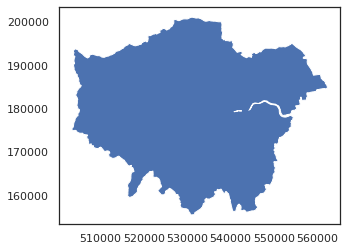

In [144]:
ldn = gpd.GeoDataFrame(gpd.GeoSeries(data=boros.unary_union, crs='epsg:27700')).rename(columns={0:'original'})

# In order to ensure that we get all MSOAs _within_ London 
# we will buffer the boundary by 250m. If _cover_ were 
# easier to use then that option might be preferable.
ldn['geometry'] = ldn.original.buffer(250)
ldn = ldn.set_geometry('geometry')
ldn.plot();

In [145]:
ldn = ldn.to_crs("EPSG:4326")

### Select London MSOAs using a Spatial Join

Here's our first spatial join. By default it will be an _inner_ join.

In [146]:
ldn_clusters = gpd.sjoin(gdf_7clusters, ldn, op='within')
ldn_clusters.head()

,MSOA11CD,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,KMeans7,index_right,original
0,E02000001,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,4,0,"POLYGON ((535009.200 159504.700, 535005.500 15..."
1,E02000002,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,2,0,"POLYGON ((535009.200 159504.700, 535005.500 15..."
2,E02000003,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,3,0,"POLYGON ((535009.200 159504.700, 535005.500 15..."
3,E02000004,Barking and Dagenham 003,551004,186412,"POLYGON ((0.18508 51.56480, 0.18400 51.56391, ...",Barking and Dagenham,Eastbrookend,0,0,"POLYGON ((535009.200 159504.700, 535005.500 15..."
4,E02000005,Barking and Dagenham 004,548733,186824,"POLYGON ((0.14988 51.56807, 0.15076 51.56778, ...",Barking and Dagenham,Becontree Heath,0,0,"POLYGON ((535009.200 159504.700, 535005.500 15..."


In [147]:
to_drop = ['index_right','original']
ldn_clusters.drop(columns=to_drop, inplace = True)

In [148]:
ldn_clusters = ldn_clusters.set_index('MSOA11CD')
ldn_clusters.head()

,MSOA11NM,BNG_E,BNG_N,geometry,borough,msoa11hclnm,KMeans7
MSOA11CD,,,,,,,
E02000001,City of London 001,532384,181355,"POLYGON ((-0.09679 51.52325, -0.09647 51.52282...",City of London,City of London,4
E02000002,Barking and Dagenham 001,548267,189685,"POLYGON ((0.14809 51.59678, 0.14806 51.59640, ...",Barking and Dagenham,Marks Gate,2
E02000003,Barking and Dagenham 002,548259,188520,"POLYGON ((0.15063 51.58306, 0.14838 51.58075, ...",Barking and Dagenham,Chadwell Heath East,3
E02000004,Barking and Dagenham 003,551004,186412,"POLYGON ((0.18508 51.56480, 0.18400 51.56391, ...",Barking and Dagenham,Eastbrookend,0
E02000005,Barking and Dagenham 004,548733,186824,"POLYGON ((0.14988 51.56807, 0.15076 51.56778, ...",Barking and Dagenham,Becontree Heath,0


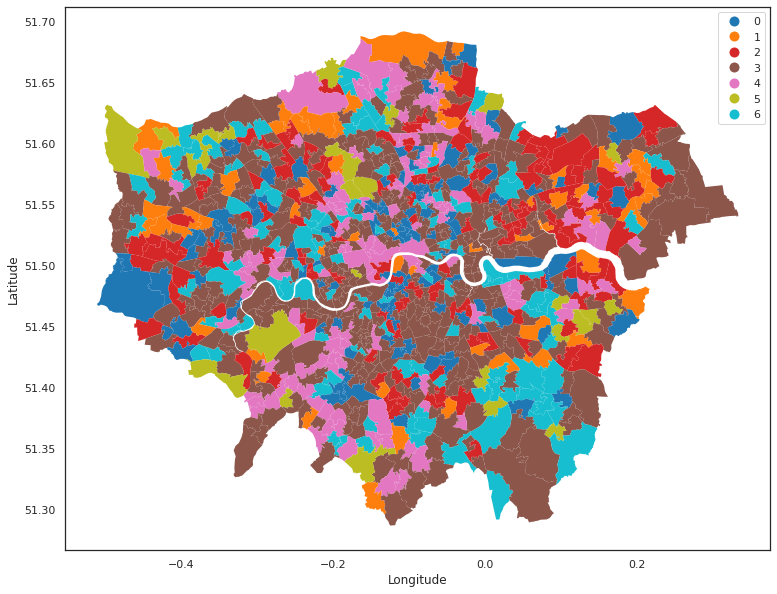

In [149]:
fig, ax = plt.subplots(figsize=(16,10))
#fig.suptitle(f"{c_nm7} Results (k={k_pref})", fontsize=20, y=0.92)

ldn_clusters.plot(column=c_nm7, ax=ax, linewidth=0, zorder=0, categorical=True, legend=True);
ax.set_ylabel('Latitude')    
ax.set_xlabel('Longitude')
plt.savefig('plots/london_clusters_ENGprofiles.png', bbox_inches='tight')

In order to plot the boxplot showing how well the MSOAs within London  'fit' their clusters, we first need to limit the previously created df - with the sse - to MSOAs only within Greater London

In [150]:
#ldn_clusters.index

In [151]:
# capture the LDN msoa codes
ldn_msoaCodes = pd.DataFrame(ldn_clusters.index)
ldn_msoaCodes

,MSOA11CD
0,E02000001
1,E02000002
2,E02000003
3,E02000004
4,E02000005
...,...
978,E02006927
979,E02006928
980,E02006929
981,E02006930


In [152]:
# check the shape of the df to ensure it's only of London
ldn_msoaCodes.shape

(983, 1)

In [153]:
# merge to get the necessary data - limited to the geography of Gretaer London
ldn_vars12_w_centres = pd.merge(ldn_msoaCodes, vars12_w_centres, on = 'MSOA11CD')
print(ldn_vars12_w_centres.shape)
print(ldn_vars12_w_centres.head(3))

(983, 30)
    MSOA11CD  preventable_deaths  black  chinese_other  subcont  imd19  \
0  E02000001                0.00   0.00           0.27    -2.18   0.00   
1  E02000002                0.00   0.76          -0.26    -1.04  -0.00   
2  E02000003                0.00   0.71          -0.00     0.26  -1.31   

   pop_0_15  pop_16_24  pop_25_64  pop_above_65  ...  diff_0  diff_1  diff_2  \
0      0.00       0.00      -0.00         -2.14  ...    0.03    0.12    0.26   
1      0.76      -4.51       0.00          0.00  ...    0.00    0.78    0.01   
2      0.14       0.00      -0.75          0.00  ...    0.00    0.62    0.01   

   diff_3  diff_4  diff_5  diff_6  diff_7  diff_8  sse  
0    0.36    0.06    0.07    0.04    0.04    3.86 4.84  
1    1.08    0.00    0.85    3.18    0.16    0.02 6.09  
2    0.05    1.71    0.02    0.00    0.49    0.00 2.90  

[3 rows x 30 columns]


### Boxplots showing the distribution of total within sum of squares by cluster group
Limited to the MSOAs within Greater London

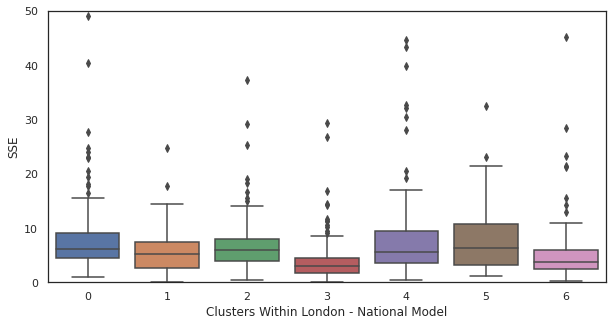

In [154]:
fig, ax = plt.subplots(figsize=(10,5))
plt.ylim(0, 50)
ax = sns.boxplot(x = 'label_7clusters', y = 'sse', data = ldn_vars12_w_centres)

ax.set_ylabel('SSE')    
ax.set_xlabel('Clusters Within London - National Model')
plt.savefig('plots/sseBoxplots_ENG.png', bbox_inches='tight')